# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

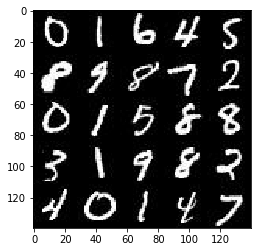

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

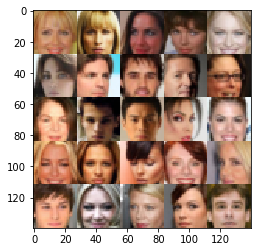

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # DONE: Implement Function
    
    tensor_input_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels])
    tensor_z = tf.placeholder(tf.float32, [None, z_dim])
    lr = tf.placeholder(tf.float32)

    return tensor_input_images, tensor_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
alpha_ = 0.01

def discriminator(images, reuse=False, alpha=alpha_):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # DONE: Implement Function
    
    def conv_layer(inputs, depth, bn=True):
        conv = tf.layers.conv2d(inputs, depth, 5, strides=2, padding='same')
        if bn:
            conv = tf.layers.batch_normalization(conv, training=True)
        return tf.maximum(conv*alpha, conv)
    
    with tf.variable_scope("discriminator", reuse=reuse):
        #input: 28x28x3
        
        # Conv 1 
        conv1 = conv_layer(images, 64, bn=False)
        
        # Conv 3
        conv2 = conv_layer(conv1, 128)
        
        # Conv 4
        conv3 = conv_layer(conv2, 256)
        
        # flatten
        flat = tf.contrib.layers.flatten(conv3)
        logits = tf.layers.dense(flat,1)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=alpha_):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # DONE: Implement Function
    
    def transpose_layer(inputs, depth, strides=2, bn=True):
        conv = tf.layers.conv2d_transpose(inputs, depth, 3, strides=strides, padding='same')
        if bn:
            conv = tf.layers.batch_normalization(conv, training=is_train)
        conv = tf.maximum(alpha*conv, conv)
        return conv
    
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        fc = tf.layers.dense(z, 7*7*512)
        fc = tf.reshape(fc, (-1, 7, 7, 512))
        fc = tf.layers.batch_normalization(fc, training=is_train)
        fc = tf.maximum(alpha*fc, fc)
        # 7x7x512
        
        conv1 = transpose_layer(fc, 256, strides=1)
        # 7x7x256
        
        conv2 = transpose_layer(conv1, 128)
        # 14x14x128
        
        # Output layer
        logits = tf.layers.conv2d_transpose(conv2, out_channel_dim, 5, strides=2, padding='same')
        out = tf.tanh(logits)
        # 28*28*out_channel_dim
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, smooth=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # DONE: Implement Function
    
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # DONE: Implement Function
    
    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        t_vars = tf.trainable_variables()
        d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
        g_vars = [var for var in t_vars if var.name.startswith('generator')]
        
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    pyplot.rcParams["figure.figsize"] = [8,8]
    
    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # DONE: Build Model
    
    # data_shape: number_of_datapoints x image_width x image_height x image_channels
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            batch_i = 0
            for batch_images in get_batches(batch_size):
                # DONE: Train Model
                
                batch_i += 1
                
                batch_z = np.random.uniform(-1,1, size=(batch_size, z_dim))
                batch_images = batch_images*2 # this is important because the range of values in images are from -0.5 to 0.5
                
                sess.run(d_opt, feed_dict={input_real:batch_images, input_z:batch_z, lr:learning_rate})
                sess.run(g_opt, feed_dict={input_real:batch_images, input_z:batch_z, lr:learning_rate})
                
                if batch_i % 5 == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Batch {}".format(batch_i),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                
                if batch_i % 50 == 0:
                    show_generator_output(sess, batch_size, input_z, data_shape[3], data_image_mode)
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Batch 5 Discriminator Loss: 7.1243... Generator Loss: 0.0018
Epoch 1/2... Batch 10 Discriminator Loss: 0.6884... Generator Loss: 3.8399
Epoch 1/2... Batch 15 Discriminator Loss: 3.7769... Generator Loss: 0.0516
Epoch 1/2... Batch 20 Discriminator Loss: 0.8546... Generator Loss: 2.6298
Epoch 1/2... Batch 25 Discriminator Loss: 1.8944... Generator Loss: 2.9397
Epoch 1/2... Batch 30 Discriminator Loss: 2.3106... Generator Loss: 2.3203
Epoch 1/2... Batch 35 Discriminator Loss: 1.0017... Generator Loss: 1.4250
Epoch 1/2... Batch 40 Discriminator Loss: 1.2931... Generator Loss: 0.7710
Epoch 1/2... Batch 45 Discriminator Loss: 1.3518... Generator Loss: 0.6923
Epoch 1/2... Batch 50 Discriminator Loss: 1.2701... Generator Loss: 2.4396


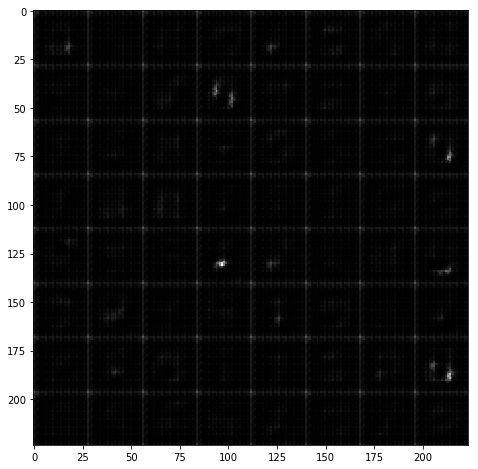

Epoch 1/2... Batch 55 Discriminator Loss: 1.1623... Generator Loss: 0.8013
Epoch 1/2... Batch 60 Discriminator Loss: 1.1709... Generator Loss: 0.9257
Epoch 1/2... Batch 65 Discriminator Loss: 1.4386... Generator Loss: 1.6237
Epoch 1/2... Batch 70 Discriminator Loss: 1.7852... Generator Loss: 1.7185
Epoch 1/2... Batch 75 Discriminator Loss: 1.5388... Generator Loss: 1.4376
Epoch 1/2... Batch 80 Discriminator Loss: 1.3533... Generator Loss: 1.3737
Epoch 1/2... Batch 85 Discriminator Loss: 1.4005... Generator Loss: 0.6966
Epoch 1/2... Batch 90 Discriminator Loss: 2.2085... Generator Loss: 0.2613
Epoch 1/2... Batch 95 Discriminator Loss: 1.5083... Generator Loss: 0.4659
Epoch 1/2... Batch 100 Discriminator Loss: 1.3411... Generator Loss: 1.0757


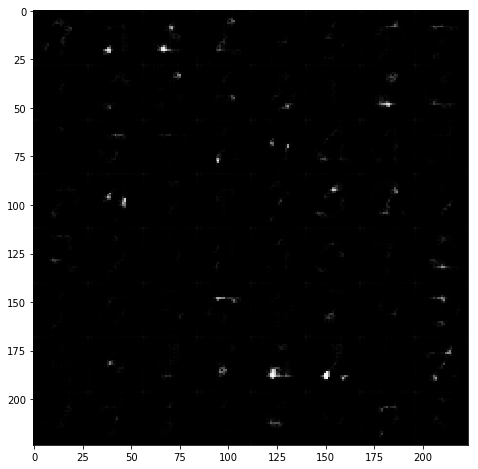

Epoch 1/2... Batch 105 Discriminator Loss: 1.1541... Generator Loss: 0.9884
Epoch 1/2... Batch 110 Discriminator Loss: 1.7053... Generator Loss: 0.3616
Epoch 1/2... Batch 115 Discriminator Loss: 1.2571... Generator Loss: 0.8474
Epoch 1/2... Batch 120 Discriminator Loss: 1.1116... Generator Loss: 0.9941
Epoch 1/2... Batch 125 Discriminator Loss: 1.3201... Generator Loss: 0.9573
Epoch 1/2... Batch 130 Discriminator Loss: 1.5915... Generator Loss: 0.4804
Epoch 1/2... Batch 135 Discriminator Loss: 1.3055... Generator Loss: 0.6179
Epoch 1/2... Batch 140 Discriminator Loss: 1.3948... Generator Loss: 1.6706
Epoch 1/2... Batch 145 Discriminator Loss: 1.5298... Generator Loss: 0.6024
Epoch 1/2... Batch 150 Discriminator Loss: 1.6172... Generator Loss: 1.6727


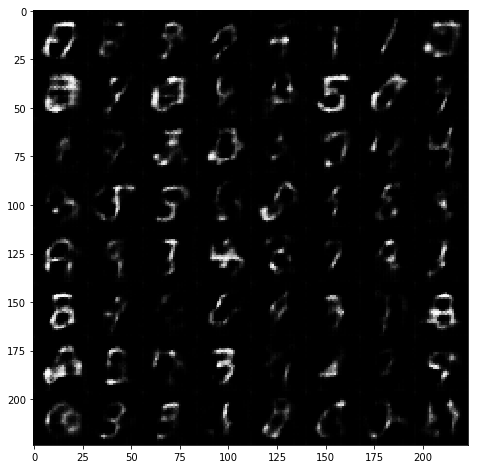

Epoch 1/2... Batch 155 Discriminator Loss: 1.3620... Generator Loss: 1.5395
Epoch 1/2... Batch 160 Discriminator Loss: 1.3637... Generator Loss: 0.7082
Epoch 1/2... Batch 165 Discriminator Loss: 1.3163... Generator Loss: 0.7347
Epoch 1/2... Batch 170 Discriminator Loss: 1.8263... Generator Loss: 0.3699
Epoch 1/2... Batch 175 Discriminator Loss: 1.3833... Generator Loss: 1.0877
Epoch 1/2... Batch 180 Discriminator Loss: 1.1063... Generator Loss: 1.1504
Epoch 1/2... Batch 185 Discriminator Loss: 1.3288... Generator Loss: 0.6748
Epoch 1/2... Batch 190 Discriminator Loss: 1.2141... Generator Loss: 0.8046
Epoch 1/2... Batch 195 Discriminator Loss: 1.2651... Generator Loss: 1.2251
Epoch 1/2... Batch 200 Discriminator Loss: 1.2327... Generator Loss: 0.9302


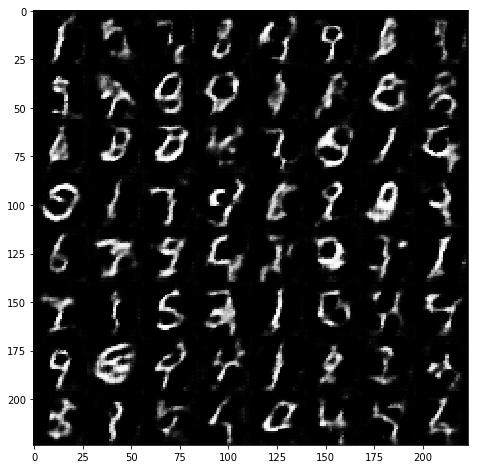

Epoch 1/2... Batch 205 Discriminator Loss: 1.6343... Generator Loss: 0.4003
Epoch 1/2... Batch 210 Discriminator Loss: 1.4696... Generator Loss: 0.5056
Epoch 1/2... Batch 215 Discriminator Loss: 1.3684... Generator Loss: 0.9437
Epoch 1/2... Batch 220 Discriminator Loss: 1.6878... Generator Loss: 0.3655
Epoch 1/2... Batch 225 Discriminator Loss: 1.2977... Generator Loss: 0.9851
Epoch 1/2... Batch 230 Discriminator Loss: 1.4889... Generator Loss: 0.5231
Epoch 1/2... Batch 235 Discriminator Loss: 1.4402... Generator Loss: 0.6305
Epoch 1/2... Batch 240 Discriminator Loss: 1.2202... Generator Loss: 0.9636
Epoch 1/2... Batch 245 Discriminator Loss: 1.6450... Generator Loss: 2.2675
Epoch 1/2... Batch 250 Discriminator Loss: 1.1946... Generator Loss: 1.0280


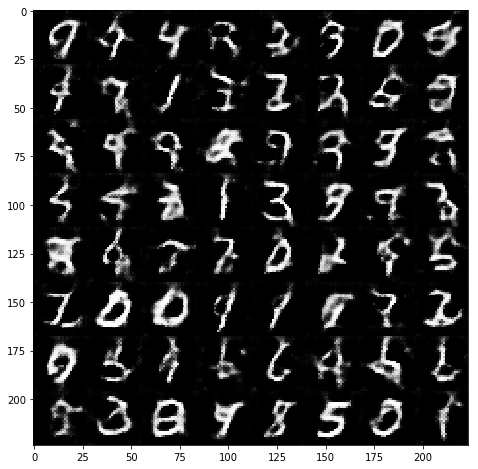

Epoch 1/2... Batch 255 Discriminator Loss: 1.3620... Generator Loss: 0.6876
Epoch 1/2... Batch 260 Discriminator Loss: 2.0387... Generator Loss: 0.2432
Epoch 1/2... Batch 265 Discriminator Loss: 1.3036... Generator Loss: 0.6635
Epoch 1/2... Batch 270 Discriminator Loss: 1.2714... Generator Loss: 1.1902
Epoch 1/2... Batch 275 Discriminator Loss: 1.4606... Generator Loss: 0.4858
Epoch 1/2... Batch 280 Discriminator Loss: 1.3053... Generator Loss: 0.8945
Epoch 1/2... Batch 285 Discriminator Loss: 1.3299... Generator Loss: 0.6436
Epoch 1/2... Batch 290 Discriminator Loss: 1.5208... Generator Loss: 1.7182
Epoch 1/2... Batch 295 Discriminator Loss: 1.3501... Generator Loss: 0.5808
Epoch 1/2... Batch 300 Discriminator Loss: 1.3263... Generator Loss: 0.5834


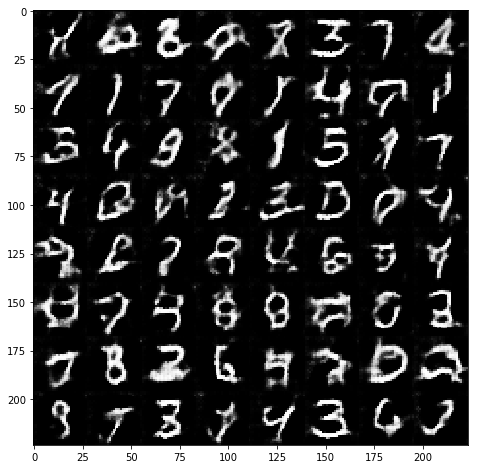

Epoch 1/2... Batch 305 Discriminator Loss: 1.4933... Generator Loss: 1.7286
Epoch 1/2... Batch 310 Discriminator Loss: 1.2471... Generator Loss: 1.0792
Epoch 1/2... Batch 315 Discriminator Loss: 1.2590... Generator Loss: 0.8597
Epoch 1/2... Batch 320 Discriminator Loss: 1.2533... Generator Loss: 0.7758
Epoch 1/2... Batch 325 Discriminator Loss: 1.5424... Generator Loss: 0.4084
Epoch 1/2... Batch 330 Discriminator Loss: 1.2335... Generator Loss: 0.7989
Epoch 1/2... Batch 335 Discriminator Loss: 1.7227... Generator Loss: 0.3614
Epoch 1/2... Batch 340 Discriminator Loss: 1.3867... Generator Loss: 1.3276
Epoch 1/2... Batch 345 Discriminator Loss: 1.2994... Generator Loss: 0.7201
Epoch 1/2... Batch 350 Discriminator Loss: 1.3488... Generator Loss: 0.5413


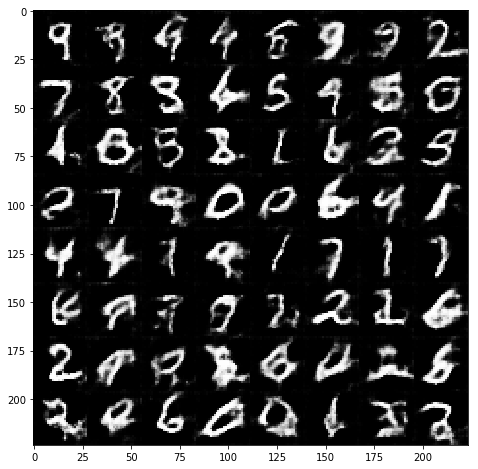

Epoch 1/2... Batch 355 Discriminator Loss: 1.1653... Generator Loss: 1.2832
Epoch 1/2... Batch 360 Discriminator Loss: 1.3113... Generator Loss: 1.5553
Epoch 1/2... Batch 365 Discriminator Loss: 1.2606... Generator Loss: 1.1026
Epoch 1/2... Batch 370 Discriminator Loss: 1.3260... Generator Loss: 0.6089
Epoch 1/2... Batch 375 Discriminator Loss: 1.2546... Generator Loss: 1.1971
Epoch 1/2... Batch 380 Discriminator Loss: 1.5051... Generator Loss: 0.4626
Epoch 1/2... Batch 385 Discriminator Loss: 1.5082... Generator Loss: 0.4565
Epoch 1/2... Batch 390 Discriminator Loss: 1.3412... Generator Loss: 1.7380
Epoch 1/2... Batch 395 Discriminator Loss: 1.3703... Generator Loss: 0.7405
Epoch 1/2... Batch 400 Discriminator Loss: 1.1907... Generator Loss: 1.2066


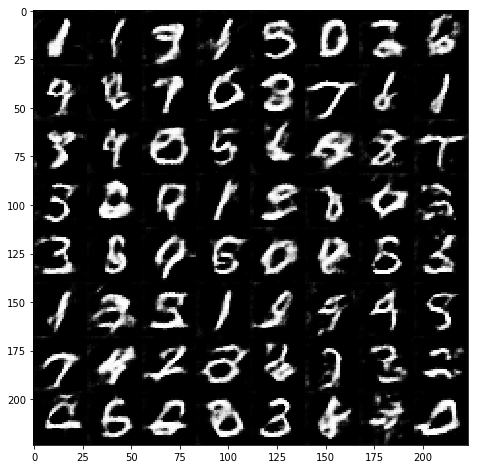

Epoch 1/2... Batch 405 Discriminator Loss: 1.3074... Generator Loss: 0.6051
Epoch 1/2... Batch 410 Discriminator Loss: 1.1239... Generator Loss: 0.9559
Epoch 1/2... Batch 415 Discriminator Loss: 1.5128... Generator Loss: 0.4487
Epoch 1/2... Batch 420 Discriminator Loss: 1.2268... Generator Loss: 1.1942
Epoch 1/2... Batch 425 Discriminator Loss: 1.2699... Generator Loss: 1.1061
Epoch 1/2... Batch 430 Discriminator Loss: 1.3597... Generator Loss: 1.7255
Epoch 1/2... Batch 435 Discriminator Loss: 1.8024... Generator Loss: 0.3363
Epoch 1/2... Batch 440 Discriminator Loss: 1.1943... Generator Loss: 0.9860
Epoch 1/2... Batch 445 Discriminator Loss: 1.1276... Generator Loss: 0.9255
Epoch 1/2... Batch 450 Discriminator Loss: 1.2148... Generator Loss: 1.2900


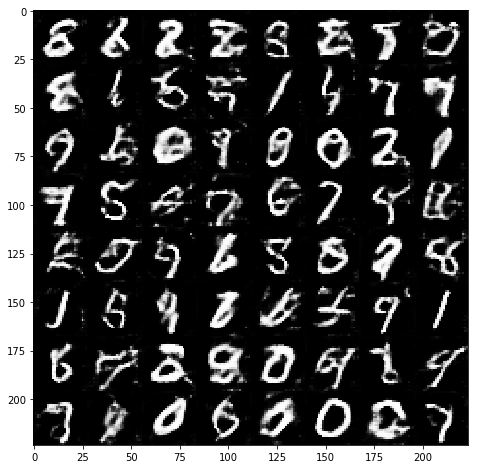

Epoch 1/2... Batch 455 Discriminator Loss: 1.7168... Generator Loss: 0.3463
Epoch 1/2... Batch 460 Discriminator Loss: 1.1823... Generator Loss: 0.7234
Epoch 1/2... Batch 465 Discriminator Loss: 1.2933... Generator Loss: 0.8740
Epoch 1/2... Batch 470 Discriminator Loss: 1.3869... Generator Loss: 1.4153
Epoch 1/2... Batch 475 Discriminator Loss: 1.2746... Generator Loss: 1.0743
Epoch 1/2... Batch 480 Discriminator Loss: 2.0465... Generator Loss: 0.2475
Epoch 1/2... Batch 485 Discriminator Loss: 1.2370... Generator Loss: 0.7961
Epoch 1/2... Batch 490 Discriminator Loss: 1.5594... Generator Loss: 0.4493
Epoch 1/2... Batch 495 Discriminator Loss: 1.4623... Generator Loss: 0.5062
Epoch 1/2... Batch 500 Discriminator Loss: 1.4520... Generator Loss: 0.5351


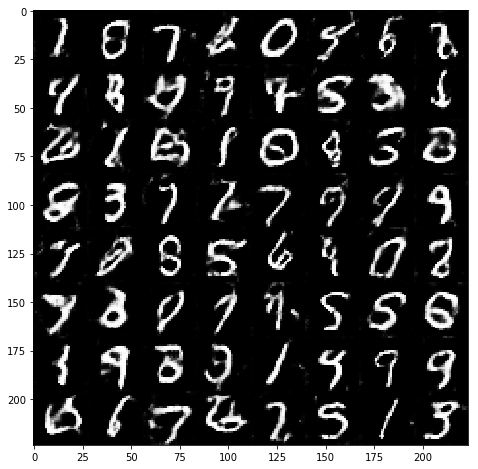

Epoch 1/2... Batch 505 Discriminator Loss: 1.4285... Generator Loss: 1.6236
Epoch 1/2... Batch 510 Discriminator Loss: 1.3543... Generator Loss: 0.6500
Epoch 1/2... Batch 515 Discriminator Loss: 1.1685... Generator Loss: 0.9944
Epoch 1/2... Batch 520 Discriminator Loss: 1.3783... Generator Loss: 0.5754
Epoch 1/2... Batch 525 Discriminator Loss: 1.2530... Generator Loss: 0.6825
Epoch 1/2... Batch 530 Discriminator Loss: 1.2320... Generator Loss: 1.6461
Epoch 1/2... Batch 535 Discriminator Loss: 1.4417... Generator Loss: 0.5143
Epoch 1/2... Batch 540 Discriminator Loss: 1.1946... Generator Loss: 0.8380
Epoch 1/2... Batch 545 Discriminator Loss: 1.6561... Generator Loss: 0.3807
Epoch 1/2... Batch 550 Discriminator Loss: 1.1853... Generator Loss: 1.2025


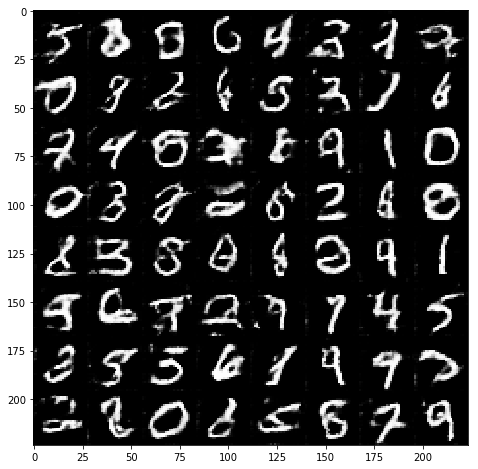

Epoch 1/2... Batch 555 Discriminator Loss: 1.2649... Generator Loss: 0.6532
Epoch 1/2... Batch 560 Discriminator Loss: 1.3007... Generator Loss: 1.6376
Epoch 1/2... Batch 565 Discriminator Loss: 1.1503... Generator Loss: 0.8766
Epoch 1/2... Batch 570 Discriminator Loss: 1.4008... Generator Loss: 0.6026
Epoch 1/2... Batch 575 Discriminator Loss: 1.7239... Generator Loss: 0.3473
Epoch 1/2... Batch 580 Discriminator Loss: 1.4008... Generator Loss: 0.5876
Epoch 1/2... Batch 585 Discriminator Loss: 1.1716... Generator Loss: 1.5544
Epoch 1/2... Batch 590 Discriminator Loss: 1.2503... Generator Loss: 0.7135
Epoch 1/2... Batch 595 Discriminator Loss: 1.1651... Generator Loss: 1.0679
Epoch 1/2... Batch 600 Discriminator Loss: 1.1824... Generator Loss: 0.7437


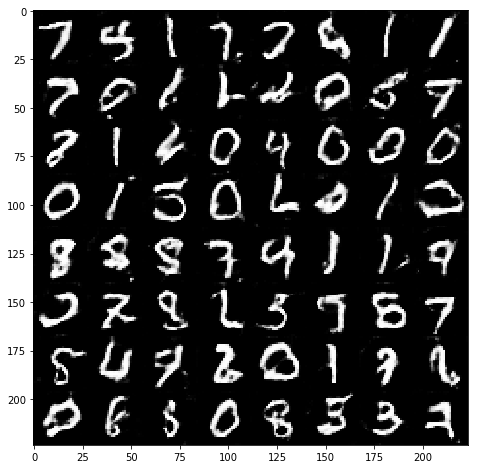

Epoch 1/2... Batch 605 Discriminator Loss: 1.2200... Generator Loss: 1.4178
Epoch 1/2... Batch 610 Discriminator Loss: 2.0828... Generator Loss: 0.2643
Epoch 1/2... Batch 615 Discriminator Loss: 1.3145... Generator Loss: 0.6774
Epoch 1/2... Batch 620 Discriminator Loss: 1.1330... Generator Loss: 1.0373
Epoch 1/2... Batch 625 Discriminator Loss: 1.5165... Generator Loss: 0.4852
Epoch 1/2... Batch 630 Discriminator Loss: 1.4224... Generator Loss: 1.5946
Epoch 1/2... Batch 635 Discriminator Loss: 1.1904... Generator Loss: 0.7182
Epoch 1/2... Batch 640 Discriminator Loss: 1.3799... Generator Loss: 0.5656
Epoch 1/2... Batch 645 Discriminator Loss: 1.3506... Generator Loss: 1.4120
Epoch 1/2... Batch 650 Discriminator Loss: 1.2004... Generator Loss: 0.7924


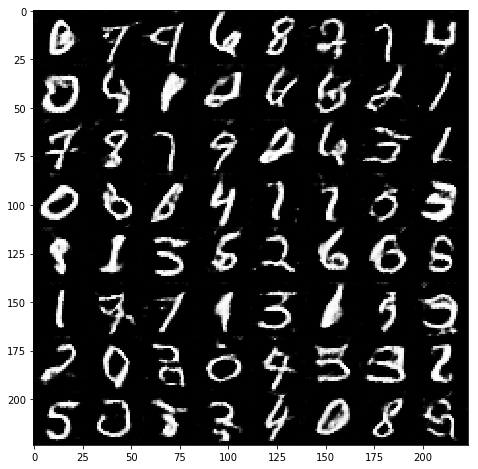

Epoch 1/2... Batch 655 Discriminator Loss: 1.5392... Generator Loss: 0.4794
Epoch 1/2... Batch 660 Discriminator Loss: 1.2591... Generator Loss: 1.6232
Epoch 1/2... Batch 665 Discriminator Loss: 1.3730... Generator Loss: 0.6333
Epoch 1/2... Batch 670 Discriminator Loss: 1.2587... Generator Loss: 1.3700
Epoch 1/2... Batch 675 Discriminator Loss: 1.2425... Generator Loss: 0.9959
Epoch 1/2... Batch 680 Discriminator Loss: 1.1812... Generator Loss: 0.8681
Epoch 1/2... Batch 685 Discriminator Loss: 1.3719... Generator Loss: 0.6616
Epoch 1/2... Batch 690 Discriminator Loss: 1.3964... Generator Loss: 2.0269
Epoch 1/2... Batch 695 Discriminator Loss: 1.4408... Generator Loss: 0.5688
Epoch 1/2... Batch 700 Discriminator Loss: 1.3943... Generator Loss: 0.5259


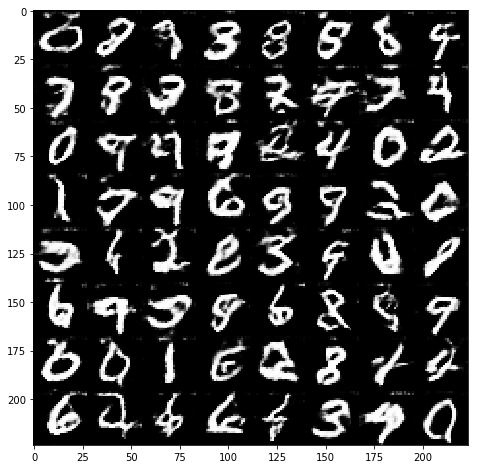

Epoch 1/2... Batch 705 Discriminator Loss: 1.1825... Generator Loss: 1.0644
Epoch 1/2... Batch 710 Discriminator Loss: 1.6030... Generator Loss: 0.4212
Epoch 1/2... Batch 715 Discriminator Loss: 1.2284... Generator Loss: 0.7160
Epoch 1/2... Batch 720 Discriminator Loss: 1.5338... Generator Loss: 0.4521
Epoch 1/2... Batch 725 Discriminator Loss: 1.8378... Generator Loss: 0.3222
Epoch 1/2... Batch 730 Discriminator Loss: 1.7724... Generator Loss: 0.3489
Epoch 1/2... Batch 735 Discriminator Loss: 1.4922... Generator Loss: 0.5075
Epoch 1/2... Batch 740 Discriminator Loss: 1.3246... Generator Loss: 1.5970
Epoch 1/2... Batch 745 Discriminator Loss: 1.1899... Generator Loss: 1.2876
Epoch 1/2... Batch 750 Discriminator Loss: 1.1982... Generator Loss: 1.0636


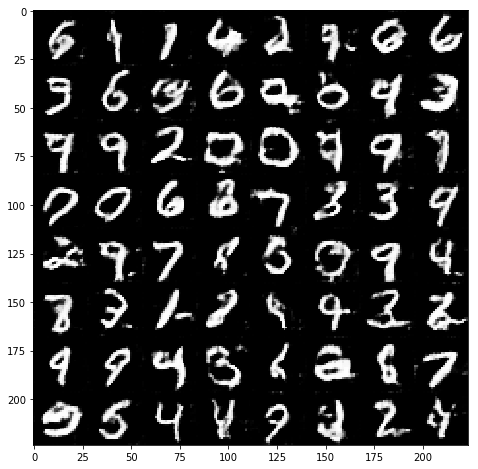

Epoch 1/2... Batch 755 Discriminator Loss: 1.5901... Generator Loss: 0.4115
Epoch 1/2... Batch 760 Discriminator Loss: 1.3613... Generator Loss: 1.6657
Epoch 1/2... Batch 765 Discriminator Loss: 1.1392... Generator Loss: 0.9819
Epoch 1/2... Batch 770 Discriminator Loss: 1.1542... Generator Loss: 1.1524
Epoch 1/2... Batch 775 Discriminator Loss: 1.2137... Generator Loss: 0.9303
Epoch 1/2... Batch 780 Discriminator Loss: 1.5682... Generator Loss: 0.4636
Epoch 1/2... Batch 785 Discriminator Loss: 1.4193... Generator Loss: 1.3576
Epoch 1/2... Batch 790 Discriminator Loss: 1.2347... Generator Loss: 0.9386
Epoch 1/2... Batch 795 Discriminator Loss: 1.5058... Generator Loss: 0.4848
Epoch 1/2... Batch 800 Discriminator Loss: 1.2111... Generator Loss: 1.1035


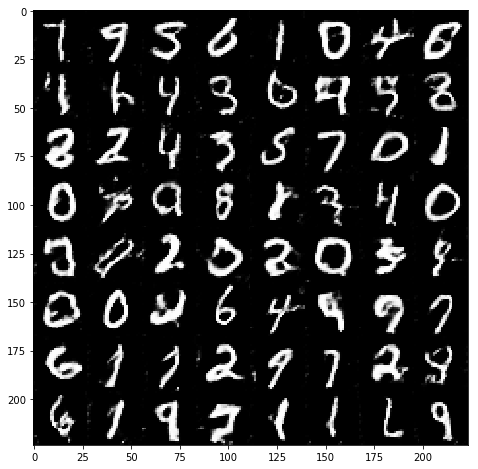

Epoch 1/2... Batch 805 Discriminator Loss: 1.1514... Generator Loss: 1.1527
Epoch 1/2... Batch 810 Discriminator Loss: 1.4053... Generator Loss: 0.5347
Epoch 1/2... Batch 815 Discriminator Loss: 1.3132... Generator Loss: 0.5955
Epoch 1/2... Batch 820 Discriminator Loss: 1.3744... Generator Loss: 0.5355
Epoch 1/2... Batch 825 Discriminator Loss: 1.1361... Generator Loss: 1.0423
Epoch 1/2... Batch 830 Discriminator Loss: 1.6505... Generator Loss: 0.3900
Epoch 1/2... Batch 835 Discriminator Loss: 1.1526... Generator Loss: 1.0830
Epoch 1/2... Batch 840 Discriminator Loss: 1.2863... Generator Loss: 1.7958
Epoch 1/2... Batch 845 Discriminator Loss: 1.3020... Generator Loss: 0.6515
Epoch 1/2... Batch 850 Discriminator Loss: 1.2488... Generator Loss: 1.5307


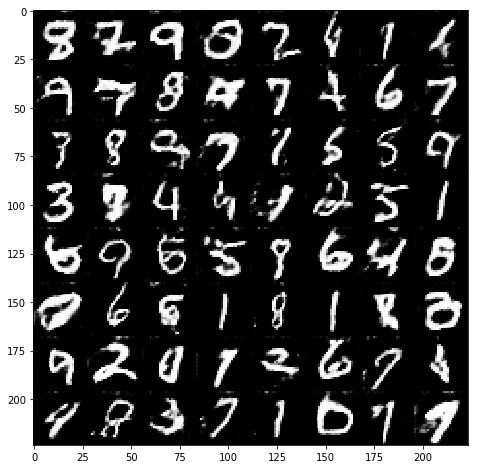

Epoch 1/2... Batch 855 Discriminator Loss: 1.3768... Generator Loss: 0.5612
Epoch 1/2... Batch 860 Discriminator Loss: 1.7651... Generator Loss: 0.3332
Epoch 1/2... Batch 865 Discriminator Loss: 1.2745... Generator Loss: 0.7068
Epoch 1/2... Batch 870 Discriminator Loss: 1.6313... Generator Loss: 0.4444
Epoch 1/2... Batch 875 Discriminator Loss: 1.4066... Generator Loss: 0.5999
Epoch 1/2... Batch 880 Discriminator Loss: 1.0998... Generator Loss: 1.1623
Epoch 1/2... Batch 885 Discriminator Loss: 1.4472... Generator Loss: 0.5029
Epoch 1/2... Batch 890 Discriminator Loss: 1.2185... Generator Loss: 1.1496
Epoch 1/2... Batch 895 Discriminator Loss: 1.2416... Generator Loss: 0.7100
Epoch 1/2... Batch 900 Discriminator Loss: 1.2750... Generator Loss: 0.6876


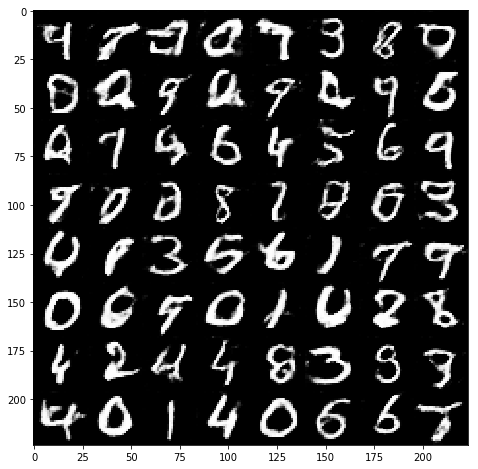

Epoch 1/2... Batch 905 Discriminator Loss: 1.2453... Generator Loss: 0.8007
Epoch 1/2... Batch 910 Discriminator Loss: 1.0950... Generator Loss: 1.0081
Epoch 1/2... Batch 915 Discriminator Loss: 1.1883... Generator Loss: 1.2854
Epoch 1/2... Batch 920 Discriminator Loss: 1.2637... Generator Loss: 0.9928
Epoch 1/2... Batch 925 Discriminator Loss: 1.2538... Generator Loss: 0.7188
Epoch 1/2... Batch 930 Discriminator Loss: 1.2884... Generator Loss: 2.0432
Epoch 1/2... Batch 935 Discriminator Loss: 1.1038... Generator Loss: 1.1810
Epoch 2/2... Batch 5 Discriminator Loss: 1.1660... Generator Loss: 1.0150
Epoch 2/2... Batch 10 Discriminator Loss: 1.2544... Generator Loss: 0.6936
Epoch 2/2... Batch 15 Discriminator Loss: 1.1684... Generator Loss: 1.0990
Epoch 2/2... Batch 20 Discriminator Loss: 1.9300... Generator Loss: 0.2929
Epoch 2/2... Batch 25 Discriminator Loss: 1.2097... Generator Loss: 0.7290
Epoch 2/2... Batch 30 Discriminator Loss: 1.0800... Generator Loss: 1.0756
Epoch 2/2... Batch 

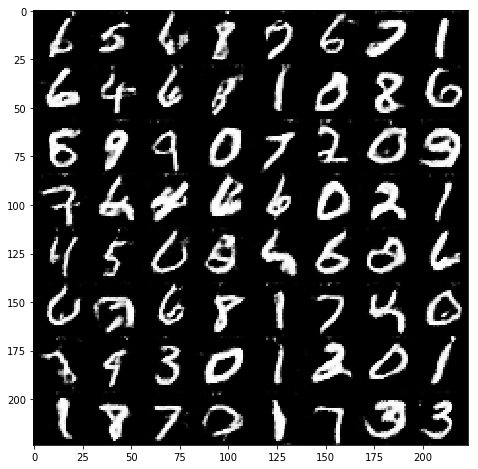

Epoch 2/2... Batch 55 Discriminator Loss: 1.5874... Generator Loss: 0.4254
Epoch 2/2... Batch 60 Discriminator Loss: 1.3372... Generator Loss: 0.5664
Epoch 2/2... Batch 65 Discriminator Loss: 1.6363... Generator Loss: 2.8872
Epoch 2/2... Batch 70 Discriminator Loss: 1.2674... Generator Loss: 1.1012
Epoch 2/2... Batch 75 Discriminator Loss: 1.1770... Generator Loss: 0.7339
Epoch 2/2... Batch 80 Discriminator Loss: 1.2710... Generator Loss: 0.6277
Epoch 2/2... Batch 85 Discriminator Loss: 1.0696... Generator Loss: 1.3386
Epoch 2/2... Batch 90 Discriminator Loss: 1.0944... Generator Loss: 1.2730
Epoch 2/2... Batch 95 Discriminator Loss: 1.2133... Generator Loss: 0.6950
Epoch 2/2... Batch 100 Discriminator Loss: 1.4242... Generator Loss: 0.5185


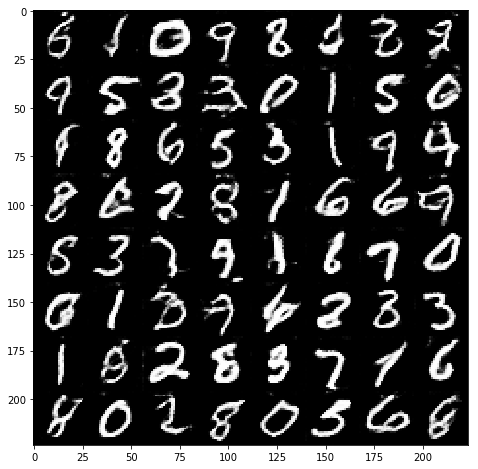

Epoch 2/2... Batch 105 Discriminator Loss: 1.0604... Generator Loss: 0.8860
Epoch 2/2... Batch 110 Discriminator Loss: 1.2078... Generator Loss: 0.6856
Epoch 2/2... Batch 115 Discriminator Loss: 1.2582... Generator Loss: 0.7460
Epoch 2/2... Batch 120 Discriminator Loss: 1.3176... Generator Loss: 0.8075
Epoch 2/2... Batch 125 Discriminator Loss: 1.3157... Generator Loss: 0.6016
Epoch 2/2... Batch 130 Discriminator Loss: 2.0921... Generator Loss: 0.3570
Epoch 2/2... Batch 135 Discriminator Loss: 1.2657... Generator Loss: 0.7450
Epoch 2/2... Batch 140 Discriminator Loss: 1.3194... Generator Loss: 0.7878
Epoch 2/2... Batch 145 Discriminator Loss: 1.3573... Generator Loss: 0.9841
Epoch 2/2... Batch 150 Discriminator Loss: 1.1085... Generator Loss: 0.9671


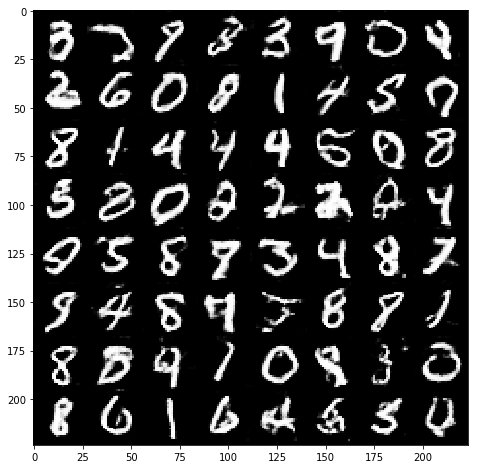

Epoch 2/2... Batch 155 Discriminator Loss: 0.9386... Generator Loss: 1.0447
Epoch 2/2... Batch 160 Discriminator Loss: 1.3850... Generator Loss: 1.8771
Epoch 2/2... Batch 165 Discriminator Loss: 1.1827... Generator Loss: 1.4529
Epoch 2/2... Batch 170 Discriminator Loss: 1.3479... Generator Loss: 0.5999
Epoch 2/2... Batch 175 Discriminator Loss: 1.2563... Generator Loss: 0.7447
Epoch 2/2... Batch 180 Discriminator Loss: 1.4124... Generator Loss: 0.5315
Epoch 2/2... Batch 185 Discriminator Loss: 1.5451... Generator Loss: 0.4846
Epoch 2/2... Batch 190 Discriminator Loss: 1.1441... Generator Loss: 1.7093
Epoch 2/2... Batch 195 Discriminator Loss: 1.5008... Generator Loss: 0.5194
Epoch 2/2... Batch 200 Discriminator Loss: 1.1077... Generator Loss: 1.5380


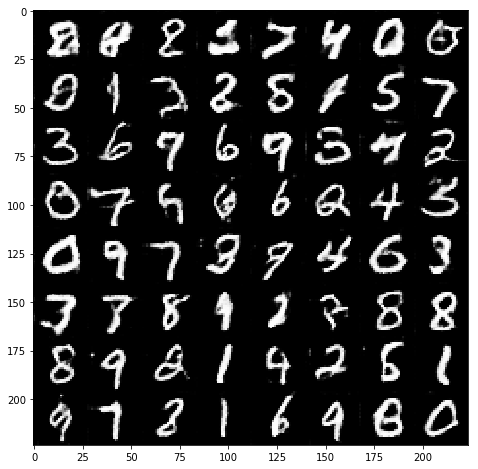

Epoch 2/2... Batch 205 Discriminator Loss: 1.4513... Generator Loss: 0.4834
Epoch 2/2... Batch 210 Discriminator Loss: 1.2285... Generator Loss: 0.8625
Epoch 2/2... Batch 215 Discriminator Loss: 1.0604... Generator Loss: 1.0701
Epoch 2/2... Batch 220 Discriminator Loss: 1.0609... Generator Loss: 1.9142
Epoch 2/2... Batch 225 Discriminator Loss: 1.0530... Generator Loss: 0.9839
Epoch 2/2... Batch 230 Discriminator Loss: 1.8340... Generator Loss: 0.4056
Epoch 2/2... Batch 235 Discriminator Loss: 2.1589... Generator Loss: 0.2179
Epoch 2/2... Batch 240 Discriminator Loss: 1.4423... Generator Loss: 0.5057
Epoch 2/2... Batch 245 Discriminator Loss: 1.0108... Generator Loss: 1.2572
Epoch 2/2... Batch 250 Discriminator Loss: 0.9792... Generator Loss: 1.1703


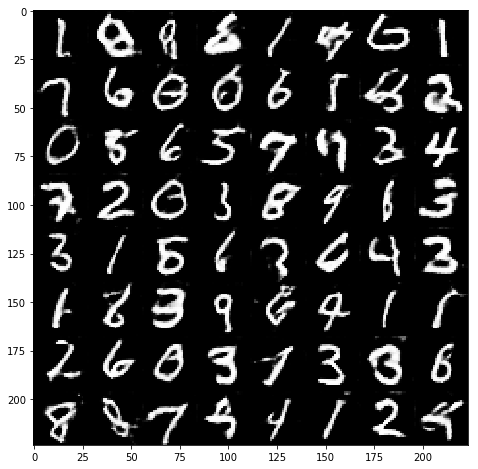

Epoch 2/2... Batch 255 Discriminator Loss: 1.6709... Generator Loss: 0.4181
Epoch 2/2... Batch 260 Discriminator Loss: 1.0632... Generator Loss: 0.8901
Epoch 2/2... Batch 265 Discriminator Loss: 1.3516... Generator Loss: 0.7246
Epoch 2/2... Batch 270 Discriminator Loss: 0.9589... Generator Loss: 1.4576
Epoch 2/2... Batch 275 Discriminator Loss: 1.8254... Generator Loss: 0.3439
Epoch 2/2... Batch 280 Discriminator Loss: 1.3531... Generator Loss: 0.6385
Epoch 2/2... Batch 285 Discriminator Loss: 1.4903... Generator Loss: 0.5179
Epoch 2/2... Batch 290 Discriminator Loss: 1.0474... Generator Loss: 1.1982
Epoch 2/2... Batch 295 Discriminator Loss: 1.2625... Generator Loss: 1.0167
Epoch 2/2... Batch 300 Discriminator Loss: 1.4677... Generator Loss: 0.4771


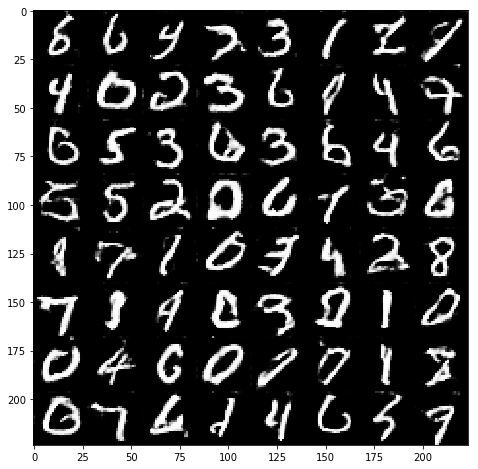

Epoch 2/2... Batch 305 Discriminator Loss: 1.5523... Generator Loss: 0.4374
Epoch 2/2... Batch 310 Discriminator Loss: 0.9193... Generator Loss: 1.5256
Epoch 2/2... Batch 315 Discriminator Loss: 1.6110... Generator Loss: 0.4090
Epoch 2/2... Batch 320 Discriminator Loss: 1.5432... Generator Loss: 0.4530
Epoch 2/2... Batch 325 Discriminator Loss: 1.3448... Generator Loss: 0.5859
Epoch 2/2... Batch 330 Discriminator Loss: 1.1506... Generator Loss: 1.0033
Epoch 2/2... Batch 335 Discriminator Loss: 1.2766... Generator Loss: 0.6194
Epoch 2/2... Batch 340 Discriminator Loss: 1.1524... Generator Loss: 0.8019
Epoch 2/2... Batch 345 Discriminator Loss: 1.2241... Generator Loss: 1.5358
Epoch 2/2... Batch 350 Discriminator Loss: 1.1881... Generator Loss: 0.8711


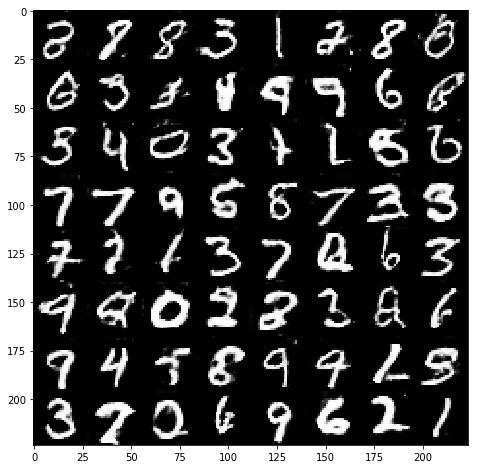

Epoch 2/2... Batch 355 Discriminator Loss: 1.3988... Generator Loss: 0.5899
Epoch 2/2... Batch 360 Discriminator Loss: 1.8045... Generator Loss: 0.3201
Epoch 2/2... Batch 365 Discriminator Loss: 1.8593... Generator Loss: 0.3036
Epoch 2/2... Batch 370 Discriminator Loss: 1.5163... Generator Loss: 0.4408
Epoch 2/2... Batch 375 Discriminator Loss: 1.4125... Generator Loss: 0.6196
Epoch 2/2... Batch 380 Discriminator Loss: 1.1675... Generator Loss: 0.9484
Epoch 2/2... Batch 385 Discriminator Loss: 1.7429... Generator Loss: 0.3738
Epoch 2/2... Batch 390 Discriminator Loss: 1.2495... Generator Loss: 0.8699
Epoch 2/2... Batch 395 Discriminator Loss: 1.3634... Generator Loss: 0.6027
Epoch 2/2... Batch 400 Discriminator Loss: 1.0946... Generator Loss: 1.3364


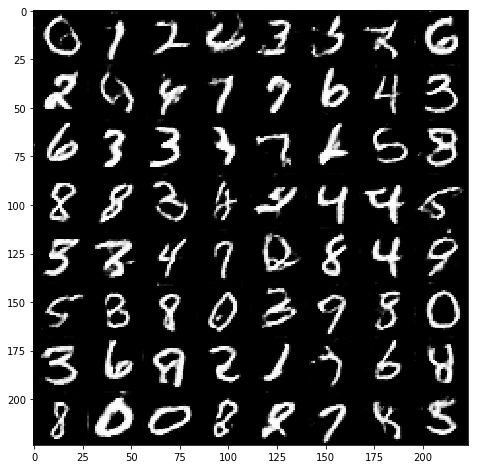

Epoch 2/2... Batch 405 Discriminator Loss: 1.1664... Generator Loss: 0.7337
Epoch 2/2... Batch 410 Discriminator Loss: 0.9995... Generator Loss: 0.9267
Epoch 2/2... Batch 415 Discriminator Loss: 1.8411... Generator Loss: 0.3262
Epoch 2/2... Batch 420 Discriminator Loss: 1.1787... Generator Loss: 1.1841
Epoch 2/2... Batch 425 Discriminator Loss: 1.2264... Generator Loss: 0.7026
Epoch 2/2... Batch 430 Discriminator Loss: 1.1943... Generator Loss: 0.7239
Epoch 2/2... Batch 435 Discriminator Loss: 1.3767... Generator Loss: 0.7292
Epoch 2/2... Batch 440 Discriminator Loss: 1.6868... Generator Loss: 0.3625
Epoch 2/2... Batch 445 Discriminator Loss: 1.4937... Generator Loss: 0.4514
Epoch 2/2... Batch 450 Discriminator Loss: 1.1077... Generator Loss: 1.2357


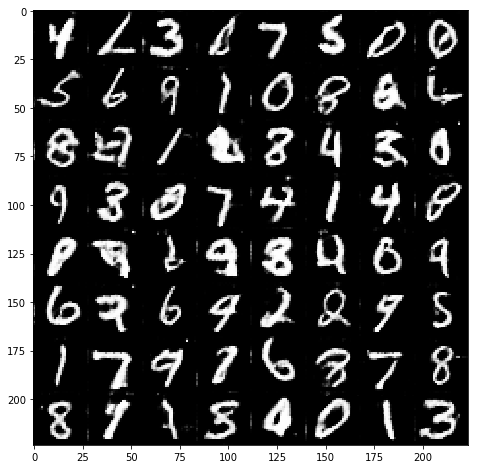

Epoch 2/2... Batch 455 Discriminator Loss: 1.1154... Generator Loss: 1.5350
Epoch 2/2... Batch 460 Discriminator Loss: 1.2195... Generator Loss: 2.0859
Epoch 2/2... Batch 465 Discriminator Loss: 1.4345... Generator Loss: 0.5391
Epoch 2/2... Batch 470 Discriminator Loss: 1.9413... Generator Loss: 0.2920
Epoch 2/2... Batch 475 Discriminator Loss: 1.0599... Generator Loss: 1.0541
Epoch 2/2... Batch 480 Discriminator Loss: 1.0665... Generator Loss: 0.8429
Epoch 2/2... Batch 485 Discriminator Loss: 1.4542... Generator Loss: 0.5089
Epoch 2/2... Batch 490 Discriminator Loss: 1.3915... Generator Loss: 0.5419
Epoch 2/2... Batch 495 Discriminator Loss: 1.4650... Generator Loss: 0.5092
Epoch 2/2... Batch 500 Discriminator Loss: 1.4162... Generator Loss: 1.2672


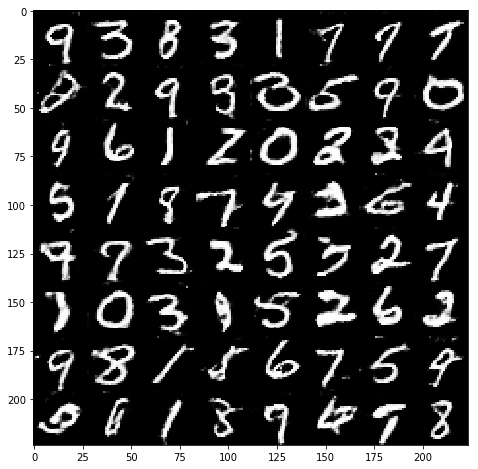

Epoch 2/2... Batch 505 Discriminator Loss: 1.0437... Generator Loss: 1.2467
Epoch 2/2... Batch 510 Discriminator Loss: 1.2541... Generator Loss: 0.7770
Epoch 2/2... Batch 515 Discriminator Loss: 1.3491... Generator Loss: 0.5810
Epoch 2/2... Batch 520 Discriminator Loss: 1.5157... Generator Loss: 0.4343
Epoch 2/2... Batch 525 Discriminator Loss: 1.1827... Generator Loss: 1.0141
Epoch 2/2... Batch 530 Discriminator Loss: 1.2574... Generator Loss: 0.6119
Epoch 2/2... Batch 535 Discriminator Loss: 1.3809... Generator Loss: 0.6095
Epoch 2/2... Batch 540 Discriminator Loss: 1.1893... Generator Loss: 0.7385
Epoch 2/2... Batch 545 Discriminator Loss: 1.5130... Generator Loss: 0.5170
Epoch 2/2... Batch 550 Discriminator Loss: 1.1627... Generator Loss: 1.4734


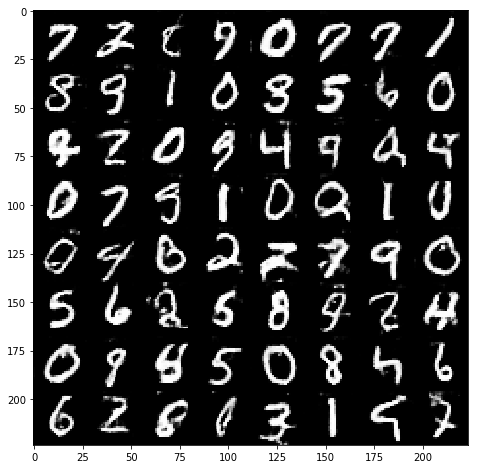

Epoch 2/2... Batch 555 Discriminator Loss: 1.1656... Generator Loss: 0.7851
Epoch 2/2... Batch 560 Discriminator Loss: 1.7641... Generator Loss: 0.3565
Epoch 2/2... Batch 565 Discriminator Loss: 1.2958... Generator Loss: 0.5944
Epoch 2/2... Batch 570 Discriminator Loss: 1.1644... Generator Loss: 0.8032
Epoch 2/2... Batch 575 Discriminator Loss: 1.6546... Generator Loss: 0.3997
Epoch 2/2... Batch 580 Discriminator Loss: 1.6551... Generator Loss: 0.3956
Epoch 2/2... Batch 585 Discriminator Loss: 1.9308... Generator Loss: 0.2897
Epoch 2/2... Batch 590 Discriminator Loss: 1.2742... Generator Loss: 0.8650
Epoch 2/2... Batch 595 Discriminator Loss: 1.2101... Generator Loss: 0.8960
Epoch 2/2... Batch 600 Discriminator Loss: 1.2121... Generator Loss: 0.6900


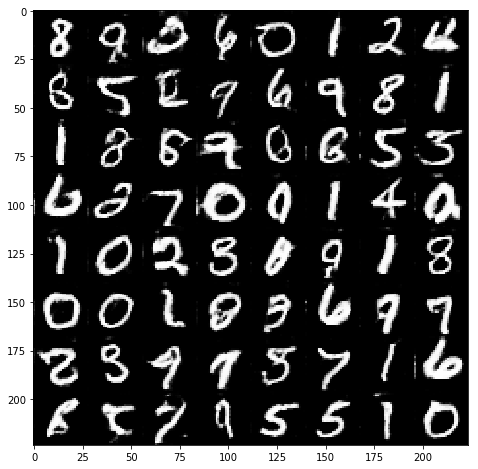

Epoch 2/2... Batch 605 Discriminator Loss: 1.2934... Generator Loss: 0.7114
Epoch 2/2... Batch 610 Discriminator Loss: 1.3404... Generator Loss: 0.5646
Epoch 2/2... Batch 615 Discriminator Loss: 1.4173... Generator Loss: 0.5088
Epoch 2/2... Batch 620 Discriminator Loss: 2.0815... Generator Loss: 0.2591
Epoch 2/2... Batch 625 Discriminator Loss: 1.3017... Generator Loss: 0.6959
Epoch 2/2... Batch 630 Discriminator Loss: 1.1562... Generator Loss: 1.6784
Epoch 2/2... Batch 635 Discriminator Loss: 1.6731... Generator Loss: 0.4026
Epoch 2/2... Batch 640 Discriminator Loss: 0.9942... Generator Loss: 1.3444
Epoch 2/2... Batch 645 Discriminator Loss: 1.5986... Generator Loss: 0.4445
Epoch 2/2... Batch 650 Discriminator Loss: 1.1299... Generator Loss: 0.7673


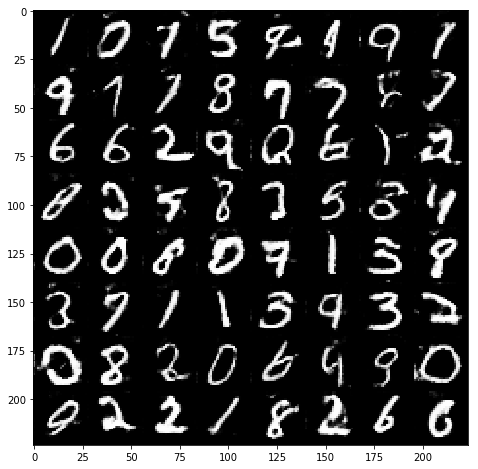

Epoch 2/2... Batch 655 Discriminator Loss: 2.0260... Generator Loss: 3.0030
Epoch 2/2... Batch 660 Discriminator Loss: 2.0772... Generator Loss: 0.2584
Epoch 2/2... Batch 665 Discriminator Loss: 1.3581... Generator Loss: 0.5978
Epoch 2/2... Batch 670 Discriminator Loss: 1.1767... Generator Loss: 0.7653
Epoch 2/2... Batch 675 Discriminator Loss: 1.2605... Generator Loss: 0.6799
Epoch 2/2... Batch 680 Discriminator Loss: 1.7504... Generator Loss: 2.5329
Epoch 2/2... Batch 685 Discriminator Loss: 1.4063... Generator Loss: 0.7700
Epoch 2/2... Batch 690 Discriminator Loss: 1.2107... Generator Loss: 1.6967
Epoch 2/2... Batch 695 Discriminator Loss: 1.6408... Generator Loss: 0.4169
Epoch 2/2... Batch 700 Discriminator Loss: 1.2477... Generator Loss: 0.9640


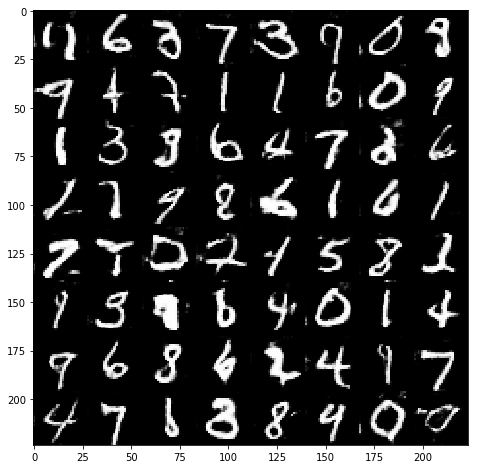

Epoch 2/2... Batch 705 Discriminator Loss: 1.3453... Generator Loss: 0.5982
Epoch 2/2... Batch 710 Discriminator Loss: 1.1431... Generator Loss: 0.8821
Epoch 2/2... Batch 715 Discriminator Loss: 1.4671... Generator Loss: 2.0500
Epoch 2/2... Batch 720 Discriminator Loss: 1.1109... Generator Loss: 0.9181
Epoch 2/2... Batch 725 Discriminator Loss: 1.1648... Generator Loss: 0.7528
Epoch 2/2... Batch 730 Discriminator Loss: 1.2177... Generator Loss: 0.7071
Epoch 2/2... Batch 735 Discriminator Loss: 1.6947... Generator Loss: 0.4013
Epoch 2/2... Batch 740 Discriminator Loss: 1.0077... Generator Loss: 1.0116
Epoch 2/2... Batch 745 Discriminator Loss: 1.2536... Generator Loss: 0.6609
Epoch 2/2... Batch 750 Discriminator Loss: 1.3719... Generator Loss: 0.6322


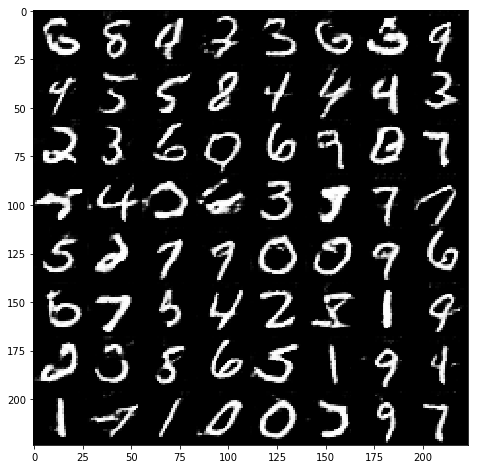

Epoch 2/2... Batch 755 Discriminator Loss: 1.3412... Generator Loss: 0.5925
Epoch 2/2... Batch 760 Discriminator Loss: 2.2349... Generator Loss: 2.7795
Epoch 2/2... Batch 765 Discriminator Loss: 1.1378... Generator Loss: 1.4486
Epoch 2/2... Batch 770 Discriminator Loss: 1.2291... Generator Loss: 0.6996
Epoch 2/2... Batch 775 Discriminator Loss: 1.1446... Generator Loss: 0.9859
Epoch 2/2... Batch 780 Discriminator Loss: 1.1943... Generator Loss: 0.6968
Epoch 2/2... Batch 785 Discriminator Loss: 1.7191... Generator Loss: 0.3463
Epoch 2/2... Batch 790 Discriminator Loss: 1.1242... Generator Loss: 1.0551
Epoch 2/2... Batch 795 Discriminator Loss: 1.2789... Generator Loss: 0.6442
Epoch 2/2... Batch 800 Discriminator Loss: 1.1654... Generator Loss: 0.8065


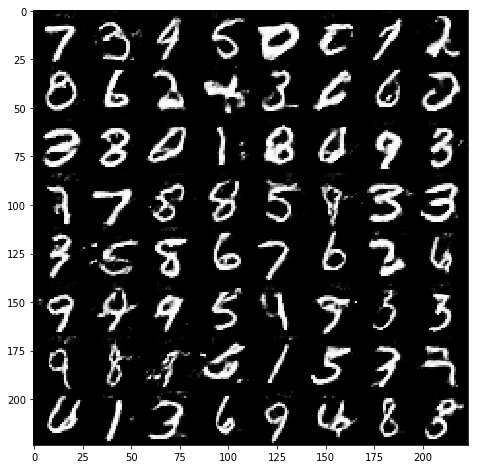

Epoch 2/2... Batch 805 Discriminator Loss: 1.2213... Generator Loss: 0.8038
Epoch 2/2... Batch 810 Discriminator Loss: 1.6657... Generator Loss: 0.3908
Epoch 2/2... Batch 815 Discriminator Loss: 1.3703... Generator Loss: 0.5720
Epoch 2/2... Batch 820 Discriminator Loss: 1.0353... Generator Loss: 0.8678
Epoch 2/2... Batch 825 Discriminator Loss: 1.7865... Generator Loss: 0.3298
Epoch 2/2... Batch 830 Discriminator Loss: 1.0993... Generator Loss: 1.3080
Epoch 2/2... Batch 835 Discriminator Loss: 1.3053... Generator Loss: 0.7616
Epoch 2/2... Batch 840 Discriminator Loss: 1.3197... Generator Loss: 0.6418
Epoch 2/2... Batch 845 Discriminator Loss: 1.5754... Generator Loss: 0.4338
Epoch 2/2... Batch 850 Discriminator Loss: 1.4183... Generator Loss: 0.5690


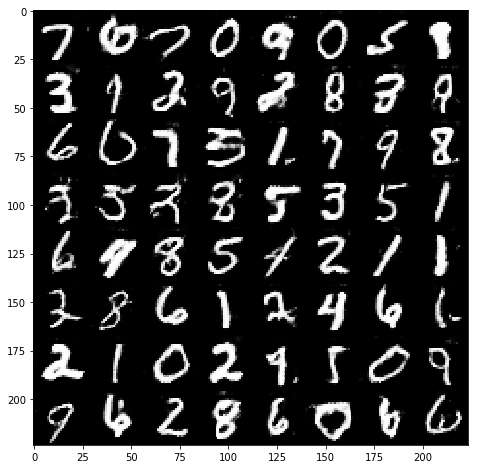

Epoch 2/2... Batch 855 Discriminator Loss: 0.9530... Generator Loss: 1.1870
Epoch 2/2... Batch 860 Discriminator Loss: 1.4203... Generator Loss: 0.5485
Epoch 2/2... Batch 865 Discriminator Loss: 1.2417... Generator Loss: 1.0413
Epoch 2/2... Batch 870 Discriminator Loss: 1.0480... Generator Loss: 1.4432
Epoch 2/2... Batch 875 Discriminator Loss: 1.3789... Generator Loss: 0.5660
Epoch 2/2... Batch 880 Discriminator Loss: 0.9313... Generator Loss: 1.1266
Epoch 2/2... Batch 885 Discriminator Loss: 2.1715... Generator Loss: 0.2687
Epoch 2/2... Batch 890 Discriminator Loss: 1.5981... Generator Loss: 0.4551
Epoch 2/2... Batch 895 Discriminator Loss: 1.6332... Generator Loss: 0.4090
Epoch 2/2... Batch 900 Discriminator Loss: 1.4117... Generator Loss: 0.6126


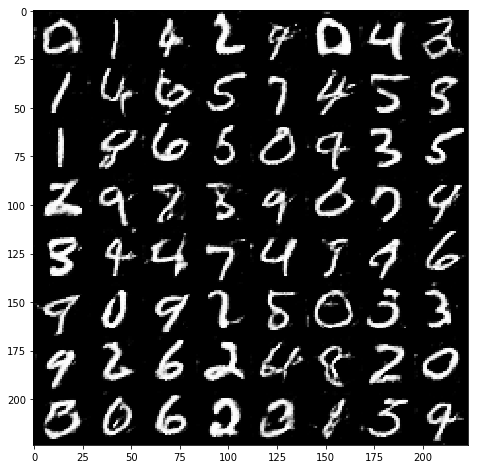

Epoch 2/2... Batch 905 Discriminator Loss: 1.0709... Generator Loss: 1.5007
Epoch 2/2... Batch 910 Discriminator Loss: 1.2494... Generator Loss: 0.6177
Epoch 2/2... Batch 915 Discriminator Loss: 1.0733... Generator Loss: 0.9266
Epoch 2/2... Batch 920 Discriminator Loss: 1.5835... Generator Loss: 0.4724
Epoch 2/2... Batch 925 Discriminator Loss: 1.6450... Generator Loss: 2.7548
Epoch 2/2... Batch 930 Discriminator Loss: 1.1636... Generator Loss: 1.8883
Epoch 2/2... Batch 935 Discriminator Loss: 0.9624... Generator Loss: 1.2614


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5
alpha_ = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Batch 5 Discriminator Loss: 0.4659... Generator Loss: 6.6439
Epoch 1/1... Batch 10 Discriminator Loss: 4.7214... Generator Loss: 0.0568
Epoch 1/1... Batch 15 Discriminator Loss: 1.6744... Generator Loss: 0.6254
Epoch 1/1... Batch 20 Discriminator Loss: 2.0433... Generator Loss: 0.4693
Epoch 1/1... Batch 25 Discriminator Loss: 2.1510... Generator Loss: 2.4405
Epoch 1/1... Batch 30 Discriminator Loss: 1.3999... Generator Loss: 0.8056
Epoch 1/1... Batch 35 Discriminator Loss: 1.6410... Generator Loss: 0.6187
Epoch 1/1... Batch 40 Discriminator Loss: 1.1120... Generator Loss: 0.9450
Epoch 1/1... Batch 45 Discriminator Loss: 1.7623... Generator Loss: 0.3992
Epoch 1/1... Batch 50 Discriminator Loss: 1.9380... Generator Loss: 0.3484


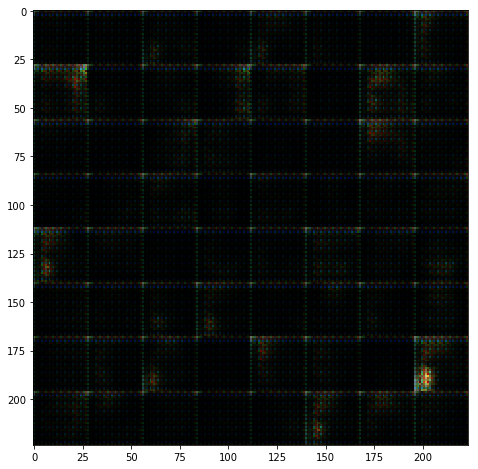

Epoch 1/1... Batch 55 Discriminator Loss: 0.9890... Generator Loss: 1.4863
Epoch 1/1... Batch 60 Discriminator Loss: 1.5812... Generator Loss: 0.4079
Epoch 1/1... Batch 65 Discriminator Loss: 0.9793... Generator Loss: 0.9219
Epoch 1/1... Batch 70 Discriminator Loss: 1.8832... Generator Loss: 0.3511
Epoch 1/1... Batch 75 Discriminator Loss: 1.1445... Generator Loss: 0.9639
Epoch 1/1... Batch 80 Discriminator Loss: 1.2698... Generator Loss: 1.4425
Epoch 1/1... Batch 85 Discriminator Loss: 1.2882... Generator Loss: 1.0370
Epoch 1/1... Batch 90 Discriminator Loss: 1.6287... Generator Loss: 0.3474
Epoch 1/1... Batch 95 Discriminator Loss: 1.2524... Generator Loss: 1.5155
Epoch 1/1... Batch 100 Discriminator Loss: 1.2924... Generator Loss: 0.5845


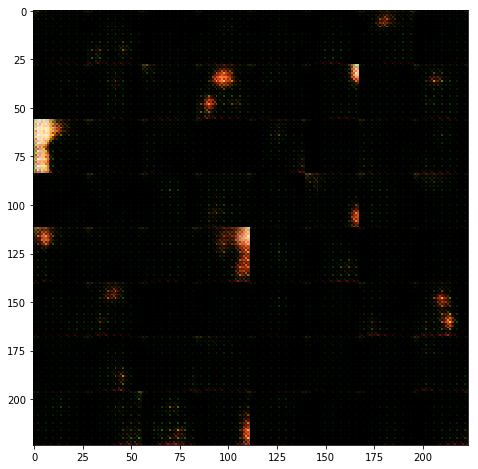

Epoch 1/1... Batch 105 Discriminator Loss: 1.0083... Generator Loss: 0.8977
Epoch 1/1... Batch 110 Discriminator Loss: 3.3788... Generator Loss: 4.2921
Epoch 1/1... Batch 115 Discriminator Loss: 0.6886... Generator Loss: 1.8299
Epoch 1/1... Batch 120 Discriminator Loss: 1.1700... Generator Loss: 0.7201
Epoch 1/1... Batch 125 Discriminator Loss: 1.3337... Generator Loss: 0.8673
Epoch 1/1... Batch 130 Discriminator Loss: 1.2452... Generator Loss: 0.6575
Epoch 1/1... Batch 135 Discriminator Loss: 1.3518... Generator Loss: 1.0642
Epoch 1/1... Batch 140 Discriminator Loss: 1.0498... Generator Loss: 1.2797
Epoch 1/1... Batch 145 Discriminator Loss: 1.2383... Generator Loss: 0.8749
Epoch 1/1... Batch 150 Discriminator Loss: 1.6966... Generator Loss: 0.5905


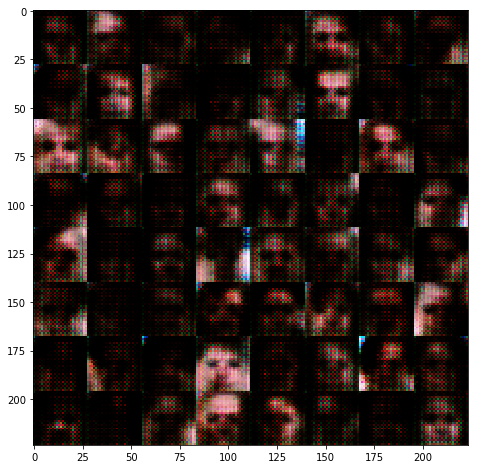

Epoch 1/1... Batch 155 Discriminator Loss: 1.1173... Generator Loss: 1.3908
Epoch 1/1... Batch 160 Discriminator Loss: 1.4248... Generator Loss: 0.5658
Epoch 1/1... Batch 165 Discriminator Loss: 0.9070... Generator Loss: 1.3630
Epoch 1/1... Batch 170 Discriminator Loss: 1.1718... Generator Loss: 0.9388
Epoch 1/1... Batch 175 Discriminator Loss: 1.6176... Generator Loss: 0.6758
Epoch 1/1... Batch 180 Discriminator Loss: 1.4423... Generator Loss: 0.8638
Epoch 1/1... Batch 185 Discriminator Loss: 1.5445... Generator Loss: 0.9087
Epoch 1/1... Batch 190 Discriminator Loss: 1.5859... Generator Loss: 0.4128
Epoch 1/1... Batch 195 Discriminator Loss: 1.5834... Generator Loss: 1.1753
Epoch 1/1... Batch 200 Discriminator Loss: 1.6023... Generator Loss: 0.6377


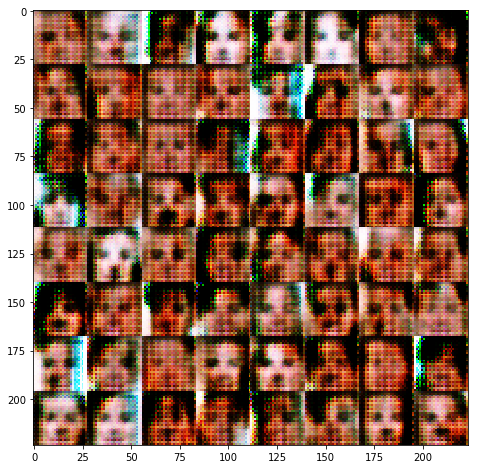

Epoch 1/1... Batch 205 Discriminator Loss: 1.1072... Generator Loss: 1.0400
Epoch 1/1... Batch 210 Discriminator Loss: 1.2717... Generator Loss: 0.8722
Epoch 1/1... Batch 215 Discriminator Loss: 1.2500... Generator Loss: 0.8675
Epoch 1/1... Batch 220 Discriminator Loss: 1.5286... Generator Loss: 0.4419
Epoch 1/1... Batch 225 Discriminator Loss: 1.3063... Generator Loss: 1.2963
Epoch 1/1... Batch 230 Discriminator Loss: 1.1074... Generator Loss: 0.9343
Epoch 1/1... Batch 235 Discriminator Loss: 2.1657... Generator Loss: 0.2314
Epoch 1/1... Batch 240 Discriminator Loss: 1.7808... Generator Loss: 0.3428
Epoch 1/1... Batch 245 Discriminator Loss: 1.2900... Generator Loss: 1.1942
Epoch 1/1... Batch 250 Discriminator Loss: 1.7321... Generator Loss: 0.3716


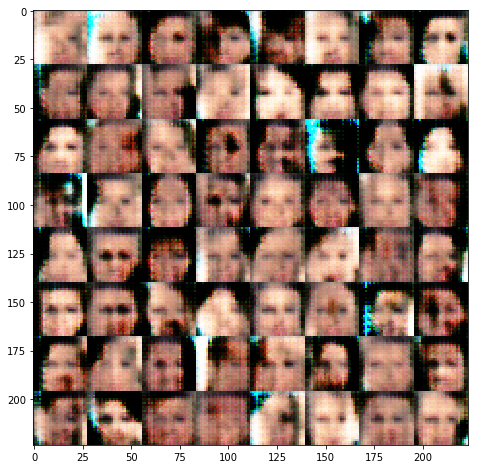

Epoch 1/1... Batch 255 Discriminator Loss: 1.1924... Generator Loss: 1.1349
Epoch 1/1... Batch 260 Discriminator Loss: 1.1845... Generator Loss: 0.6832
Epoch 1/1... Batch 265 Discriminator Loss: 1.1231... Generator Loss: 0.9714
Epoch 1/1... Batch 270 Discriminator Loss: 1.3023... Generator Loss: 1.6244
Epoch 1/1... Batch 275 Discriminator Loss: 1.5715... Generator Loss: 0.4900
Epoch 1/1... Batch 280 Discriminator Loss: 1.5152... Generator Loss: 0.6403
Epoch 1/1... Batch 285 Discriminator Loss: 1.1919... Generator Loss: 0.8899
Epoch 1/1... Batch 290 Discriminator Loss: 1.1464... Generator Loss: 1.4796
Epoch 1/1... Batch 295 Discriminator Loss: 1.6721... Generator Loss: 0.6399
Epoch 1/1... Batch 300 Discriminator Loss: 1.4992... Generator Loss: 0.5978


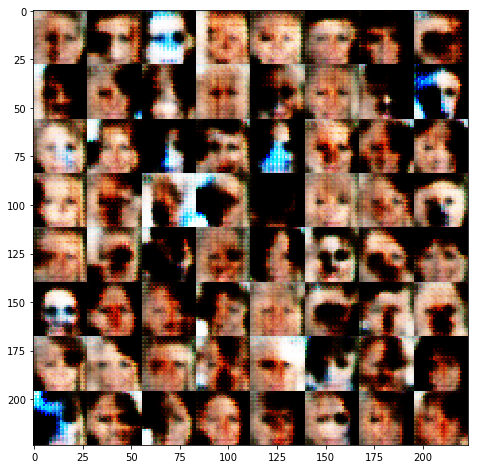

Epoch 1/1... Batch 305 Discriminator Loss: 2.1942... Generator Loss: 0.2261
Epoch 1/1... Batch 310 Discriminator Loss: 1.0235... Generator Loss: 0.8105
Epoch 1/1... Batch 315 Discriminator Loss: 1.2939... Generator Loss: 0.7038
Epoch 1/1... Batch 320 Discriminator Loss: 1.2065... Generator Loss: 1.3535
Epoch 1/1... Batch 325 Discriminator Loss: 1.2760... Generator Loss: 1.2021
Epoch 1/1... Batch 330 Discriminator Loss: 0.6862... Generator Loss: 1.4109
Epoch 1/1... Batch 335 Discriminator Loss: 1.0589... Generator Loss: 1.7215
Epoch 1/1... Batch 340 Discriminator Loss: 1.5791... Generator Loss: 0.8258
Epoch 1/1... Batch 345 Discriminator Loss: 1.3104... Generator Loss: 0.7937
Epoch 1/1... Batch 350 Discriminator Loss: 1.0939... Generator Loss: 1.1537


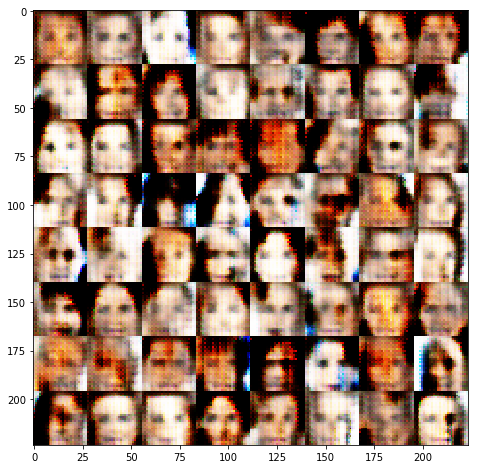

Epoch 1/1... Batch 355 Discriminator Loss: 1.4157... Generator Loss: 1.4358
Epoch 1/1... Batch 360 Discriminator Loss: 1.0075... Generator Loss: 1.1208
Epoch 1/1... Batch 365 Discriminator Loss: 1.4323... Generator Loss: 0.5073
Epoch 1/1... Batch 370 Discriminator Loss: 1.2592... Generator Loss: 0.6413
Epoch 1/1... Batch 375 Discriminator Loss: 1.3839... Generator Loss: 1.0399
Epoch 1/1... Batch 380 Discriminator Loss: 0.7389... Generator Loss: 1.3750
Epoch 1/1... Batch 385 Discriminator Loss: 2.0673... Generator Loss: 2.8800
Epoch 1/1... Batch 390 Discriminator Loss: 1.1556... Generator Loss: 1.1242
Epoch 1/1... Batch 395 Discriminator Loss: 1.0305... Generator Loss: 1.0186
Epoch 1/1... Batch 400 Discriminator Loss: 1.2286... Generator Loss: 0.6872


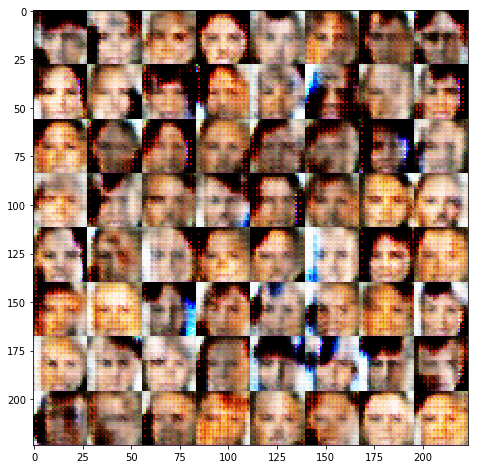

Epoch 1/1... Batch 405 Discriminator Loss: 1.4368... Generator Loss: 0.5037
Epoch 1/1... Batch 410 Discriminator Loss: 0.9383... Generator Loss: 0.9793
Epoch 1/1... Batch 415 Discriminator Loss: 1.0667... Generator Loss: 1.1550
Epoch 1/1... Batch 420 Discriminator Loss: 1.4321... Generator Loss: 0.5023
Epoch 1/1... Batch 425 Discriminator Loss: 2.0533... Generator Loss: 0.3153
Epoch 1/1... Batch 430 Discriminator Loss: 1.3497... Generator Loss: 0.8139
Epoch 1/1... Batch 435 Discriminator Loss: 1.2675... Generator Loss: 0.6467
Epoch 1/1... Batch 440 Discriminator Loss: 1.0148... Generator Loss: 1.0477
Epoch 1/1... Batch 445 Discriminator Loss: 1.0651... Generator Loss: 0.7551
Epoch 1/1... Batch 450 Discriminator Loss: 1.4728... Generator Loss: 0.5233


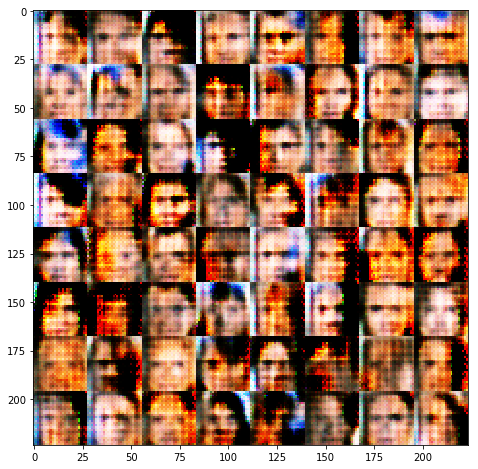

Epoch 1/1... Batch 455 Discriminator Loss: 3.2540... Generator Loss: 0.0989
Epoch 1/1... Batch 460 Discriminator Loss: 1.3568... Generator Loss: 0.6418
Epoch 1/1... Batch 465 Discriminator Loss: 1.4106... Generator Loss: 0.8699
Epoch 1/1... Batch 470 Discriminator Loss: 1.0867... Generator Loss: 1.3028
Epoch 1/1... Batch 475 Discriminator Loss: 1.0133... Generator Loss: 1.2742
Epoch 1/1... Batch 480 Discriminator Loss: 1.1449... Generator Loss: 0.9012
Epoch 1/1... Batch 485 Discriminator Loss: 0.9446... Generator Loss: 1.4881
Epoch 1/1... Batch 490 Discriminator Loss: 1.1889... Generator Loss: 1.1179
Epoch 1/1... Batch 495 Discriminator Loss: 1.4714... Generator Loss: 0.4798
Epoch 1/1... Batch 500 Discriminator Loss: 0.7214... Generator Loss: 1.3097


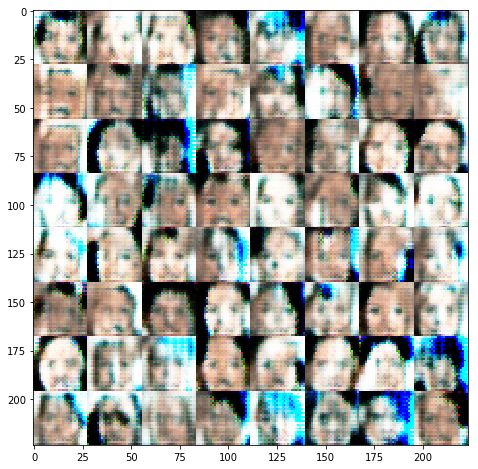

Epoch 1/1... Batch 505 Discriminator Loss: 1.1265... Generator Loss: 1.5268
Epoch 1/1... Batch 510 Discriminator Loss: 1.1370... Generator Loss: 1.2378
Epoch 1/1... Batch 515 Discriminator Loss: 0.9960... Generator Loss: 1.4800
Epoch 1/1... Batch 520 Discriminator Loss: 1.0096... Generator Loss: 1.0096
Epoch 1/1... Batch 525 Discriminator Loss: 1.1054... Generator Loss: 2.1585
Epoch 1/1... Batch 530 Discriminator Loss: 1.2990... Generator Loss: 0.7241
Epoch 1/1... Batch 535 Discriminator Loss: 1.5385... Generator Loss: 1.6281
Epoch 1/1... Batch 540 Discriminator Loss: 1.1758... Generator Loss: 1.1460
Epoch 1/1... Batch 545 Discriminator Loss: 1.0937... Generator Loss: 0.9106
Epoch 1/1... Batch 550 Discriminator Loss: 0.9694... Generator Loss: 0.8736


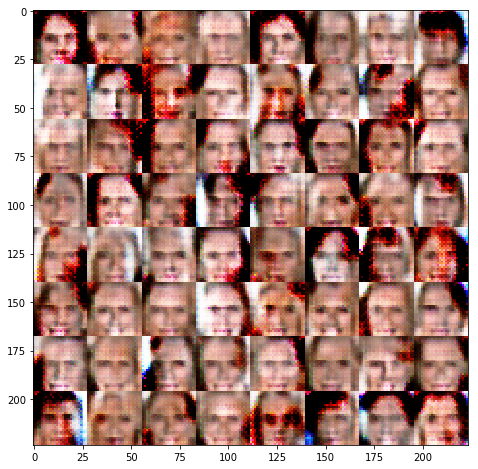

Epoch 1/1... Batch 555 Discriminator Loss: 2.0800... Generator Loss: 0.2492
Epoch 1/1... Batch 560 Discriminator Loss: 1.5186... Generator Loss: 1.2502
Epoch 1/1... Batch 565 Discriminator Loss: 1.1108... Generator Loss: 0.9001
Epoch 1/1... Batch 570 Discriminator Loss: 1.1087... Generator Loss: 1.5106
Epoch 1/1... Batch 575 Discriminator Loss: 0.9080... Generator Loss: 0.9732
Epoch 1/1... Batch 580 Discriminator Loss: 0.9328... Generator Loss: 1.0567
Epoch 1/1... Batch 585 Discriminator Loss: 1.2083... Generator Loss: 0.7413
Epoch 1/1... Batch 590 Discriminator Loss: 0.7140... Generator Loss: 1.2979
Epoch 1/1... Batch 595 Discriminator Loss: 1.2427... Generator Loss: 1.2544
Epoch 1/1... Batch 600 Discriminator Loss: 1.4083... Generator Loss: 0.5007


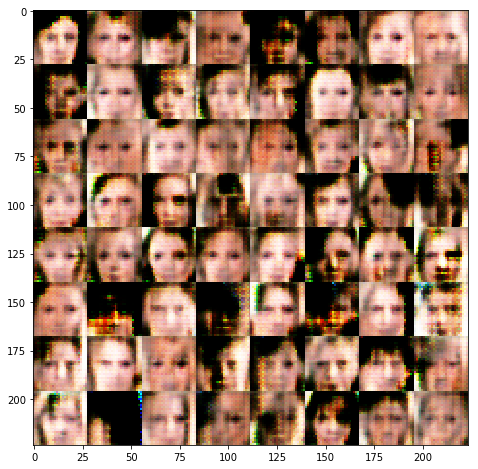

Epoch 1/1... Batch 605 Discriminator Loss: 1.0775... Generator Loss: 0.7521
Epoch 1/1... Batch 610 Discriminator Loss: 1.1582... Generator Loss: 0.8860
Epoch 1/1... Batch 615 Discriminator Loss: 1.4666... Generator Loss: 0.4398
Epoch 1/1... Batch 620 Discriminator Loss: 1.1137... Generator Loss: 0.7866
Epoch 1/1... Batch 625 Discriminator Loss: 1.2927... Generator Loss: 0.7225
Epoch 1/1... Batch 630 Discriminator Loss: 0.9176... Generator Loss: 1.0632
Epoch 1/1... Batch 635 Discriminator Loss: 1.1556... Generator Loss: 0.8756
Epoch 1/1... Batch 640 Discriminator Loss: 1.0540... Generator Loss: 1.0201
Epoch 1/1... Batch 645 Discriminator Loss: 1.0994... Generator Loss: 0.9097
Epoch 1/1... Batch 650 Discriminator Loss: 0.9488... Generator Loss: 0.8195


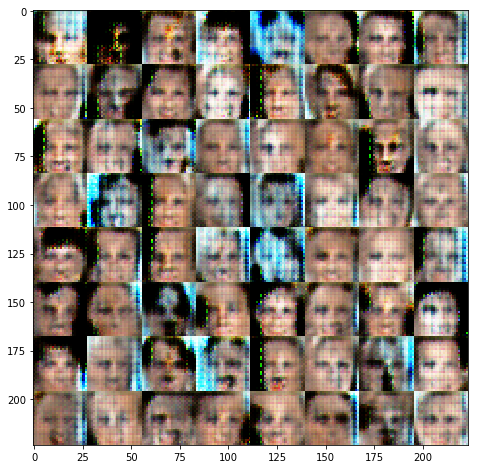

Epoch 1/1... Batch 655 Discriminator Loss: 1.2393... Generator Loss: 0.8147
Epoch 1/1... Batch 660 Discriminator Loss: 1.0154... Generator Loss: 0.9243
Epoch 1/1... Batch 665 Discriminator Loss: 1.2135... Generator Loss: 1.9396
Epoch 1/1... Batch 670 Discriminator Loss: 1.4477... Generator Loss: 0.7842
Epoch 1/1... Batch 675 Discriminator Loss: 1.0801... Generator Loss: 1.3130
Epoch 1/1... Batch 680 Discriminator Loss: 1.0644... Generator Loss: 0.8292
Epoch 1/1... Batch 685 Discriminator Loss: 1.1328... Generator Loss: 1.5321
Epoch 1/1... Batch 690 Discriminator Loss: 1.0623... Generator Loss: 1.3271
Epoch 1/1... Batch 695 Discriminator Loss: 0.9385... Generator Loss: 0.9047
Epoch 1/1... Batch 700 Discriminator Loss: 0.7432... Generator Loss: 1.1922


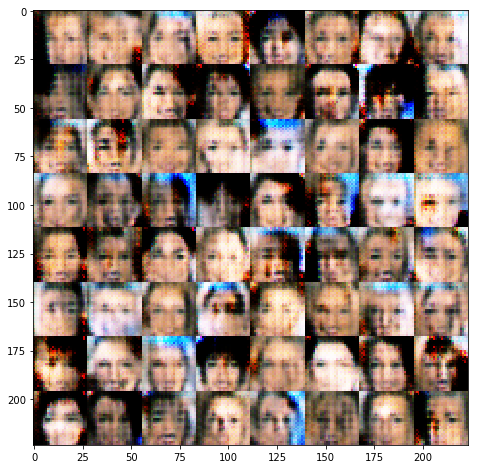

Epoch 1/1... Batch 705 Discriminator Loss: 0.9232... Generator Loss: 0.9286
Epoch 1/1... Batch 710 Discriminator Loss: 1.0429... Generator Loss: 2.3960
Epoch 1/1... Batch 715 Discriminator Loss: 0.8960... Generator Loss: 1.2346
Epoch 1/1... Batch 720 Discriminator Loss: 1.5606... Generator Loss: 2.2903
Epoch 1/1... Batch 725 Discriminator Loss: 1.2745... Generator Loss: 0.6817
Epoch 1/1... Batch 730 Discriminator Loss: 0.7624... Generator Loss: 1.1615
Epoch 1/1... Batch 735 Discriminator Loss: 1.1368... Generator Loss: 1.3440
Epoch 1/1... Batch 740 Discriminator Loss: 0.9900... Generator Loss: 1.1656
Epoch 1/1... Batch 745 Discriminator Loss: 1.0325... Generator Loss: 0.8028
Epoch 1/1... Batch 750 Discriminator Loss: 0.9684... Generator Loss: 1.4655


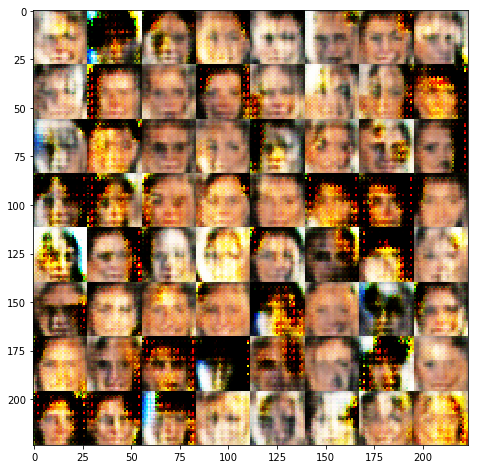

Epoch 1/1... Batch 755 Discriminator Loss: 0.9040... Generator Loss: 1.0911
Epoch 1/1... Batch 760 Discriminator Loss: 1.0911... Generator Loss: 0.8061
Epoch 1/1... Batch 765 Discriminator Loss: 0.8377... Generator Loss: 1.2380
Epoch 1/1... Batch 770 Discriminator Loss: 2.1882... Generator Loss: 2.2735
Epoch 1/1... Batch 775 Discriminator Loss: 0.7935... Generator Loss: 1.3067
Epoch 1/1... Batch 780 Discriminator Loss: 1.2667... Generator Loss: 1.5756
Epoch 1/1... Batch 785 Discriminator Loss: 1.5048... Generator Loss: 0.6515
Epoch 1/1... Batch 790 Discriminator Loss: 1.5493... Generator Loss: 0.5292
Epoch 1/1... Batch 795 Discriminator Loss: 0.9625... Generator Loss: 1.1986
Epoch 1/1... Batch 800 Discriminator Loss: 1.6746... Generator Loss: 0.7543


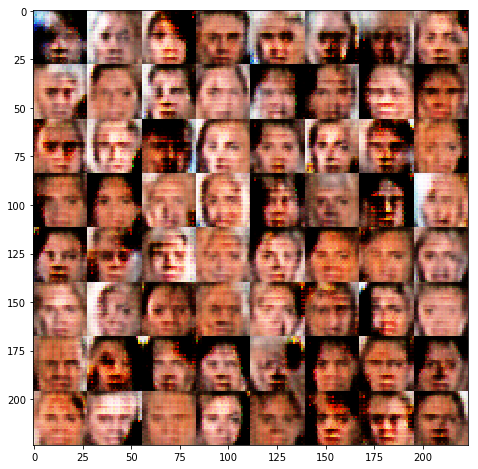

Epoch 1/1... Batch 805 Discriminator Loss: 1.5154... Generator Loss: 1.5256
Epoch 1/1... Batch 810 Discriminator Loss: 1.1329... Generator Loss: 0.9020
Epoch 1/1... Batch 815 Discriminator Loss: 1.2234... Generator Loss: 0.9719
Epoch 1/1... Batch 820 Discriminator Loss: 1.1423... Generator Loss: 1.1071
Epoch 1/1... Batch 825 Discriminator Loss: 1.2443... Generator Loss: 1.0505
Epoch 1/1... Batch 830 Discriminator Loss: 1.1885... Generator Loss: 1.0880
Epoch 1/1... Batch 835 Discriminator Loss: 1.2772... Generator Loss: 0.8534
Epoch 1/1... Batch 840 Discriminator Loss: 1.2014... Generator Loss: 0.8696
Epoch 1/1... Batch 845 Discriminator Loss: 1.1057... Generator Loss: 1.2807
Epoch 1/1... Batch 850 Discriminator Loss: 1.0720... Generator Loss: 1.1386


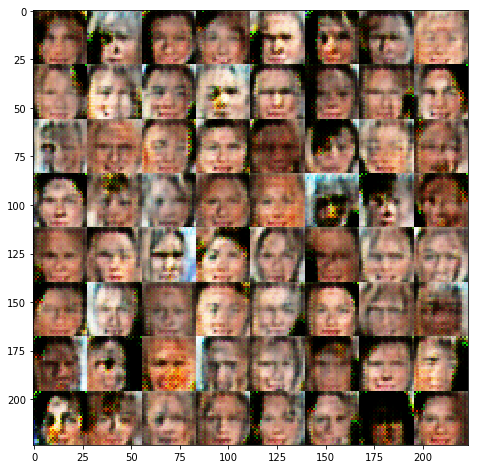

Epoch 1/1... Batch 855 Discriminator Loss: 1.4247... Generator Loss: 0.4793
Epoch 1/1... Batch 860 Discriminator Loss: 0.9524... Generator Loss: 1.1690
Epoch 1/1... Batch 865 Discriminator Loss: 0.9056... Generator Loss: 1.2800
Epoch 1/1... Batch 870 Discriminator Loss: 1.0605... Generator Loss: 0.7186
Epoch 1/1... Batch 875 Discriminator Loss: 1.2117... Generator Loss: 0.7837
Epoch 1/1... Batch 880 Discriminator Loss: 1.1141... Generator Loss: 0.9604
Epoch 1/1... Batch 885 Discriminator Loss: 1.1492... Generator Loss: 0.9906
Epoch 1/1... Batch 890 Discriminator Loss: 1.2308... Generator Loss: 0.6896
Epoch 1/1... Batch 895 Discriminator Loss: 1.0755... Generator Loss: 0.8966
Epoch 1/1... Batch 900 Discriminator Loss: 0.7781... Generator Loss: 1.2097


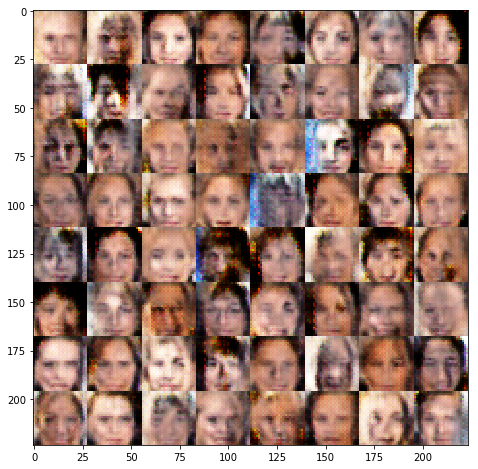

Epoch 1/1... Batch 905 Discriminator Loss: 1.1178... Generator Loss: 1.2198
Epoch 1/1... Batch 910 Discriminator Loss: 1.2573... Generator Loss: 1.2960
Epoch 1/1... Batch 915 Discriminator Loss: 1.4072... Generator Loss: 0.5977
Epoch 1/1... Batch 920 Discriminator Loss: 1.1012... Generator Loss: 1.3067
Epoch 1/1... Batch 925 Discriminator Loss: 1.0778... Generator Loss: 1.0372
Epoch 1/1... Batch 930 Discriminator Loss: 1.1468... Generator Loss: 1.2822
Epoch 1/1... Batch 935 Discriminator Loss: 1.0065... Generator Loss: 0.8481
Epoch 1/1... Batch 940 Discriminator Loss: 1.3286... Generator Loss: 0.7807
Epoch 1/1... Batch 945 Discriminator Loss: 0.8605... Generator Loss: 1.3438
Epoch 1/1... Batch 950 Discriminator Loss: 1.1095... Generator Loss: 1.0660


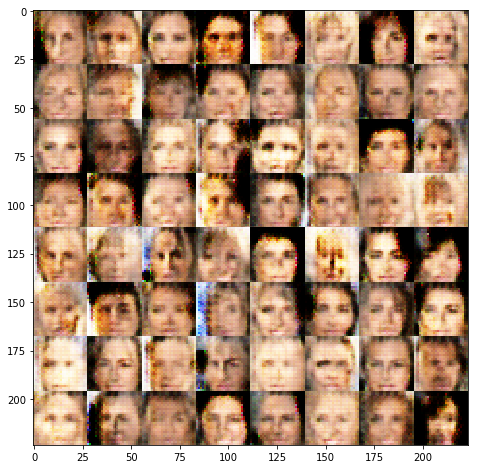

Epoch 1/1... Batch 955 Discriminator Loss: 0.7601... Generator Loss: 1.1550
Epoch 1/1... Batch 960 Discriminator Loss: 1.1734... Generator Loss: 1.6852
Epoch 1/1... Batch 965 Discriminator Loss: 1.3169... Generator Loss: 1.8407
Epoch 1/1... Batch 970 Discriminator Loss: 0.9346... Generator Loss: 1.1823
Epoch 1/1... Batch 975 Discriminator Loss: 1.1706... Generator Loss: 0.7696
Epoch 1/1... Batch 980 Discriminator Loss: 1.2171... Generator Loss: 0.6941
Epoch 1/1... Batch 985 Discriminator Loss: 1.2852... Generator Loss: 0.6259
Epoch 1/1... Batch 990 Discriminator Loss: 1.3132... Generator Loss: 0.6220
Epoch 1/1... Batch 995 Discriminator Loss: 0.9216... Generator Loss: 1.2478
Epoch 1/1... Batch 1000 Discriminator Loss: 1.1633... Generator Loss: 1.0080


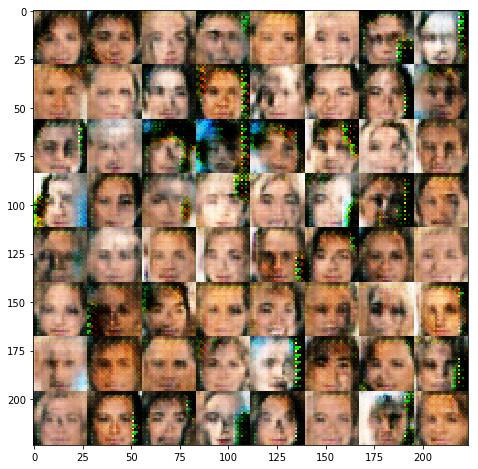

Epoch 1/1... Batch 1005 Discriminator Loss: 1.0087... Generator Loss: 1.0119
Epoch 1/1... Batch 1010 Discriminator Loss: 1.0816... Generator Loss: 0.8957
Epoch 1/1... Batch 1015 Discriminator Loss: 1.4332... Generator Loss: 2.0107
Epoch 1/1... Batch 1020 Discriminator Loss: 1.3740... Generator Loss: 2.6407
Epoch 1/1... Batch 1025 Discriminator Loss: 1.5764... Generator Loss: 0.5684
Epoch 1/1... Batch 1030 Discriminator Loss: 2.2427... Generator Loss: 0.2368
Epoch 1/1... Batch 1035 Discriminator Loss: 1.4205... Generator Loss: 0.5942
Epoch 1/1... Batch 1040 Discriminator Loss: 1.3044... Generator Loss: 1.8114
Epoch 1/1... Batch 1045 Discriminator Loss: 1.2170... Generator Loss: 0.8794
Epoch 1/1... Batch 1050 Discriminator Loss: 1.4280... Generator Loss: 0.8157


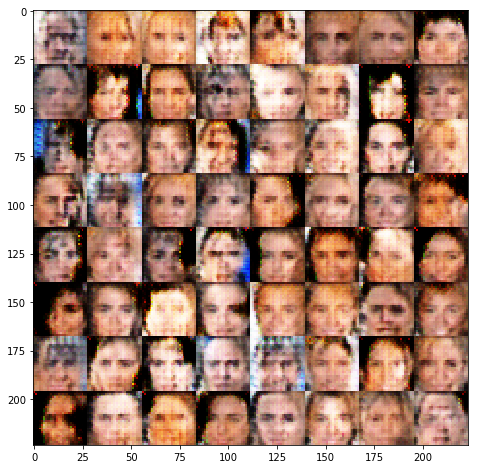

Epoch 1/1... Batch 1055 Discriminator Loss: 1.1096... Generator Loss: 0.7794
Epoch 1/1... Batch 1060 Discriminator Loss: 1.1056... Generator Loss: 0.8217
Epoch 1/1... Batch 1065 Discriminator Loss: 0.9961... Generator Loss: 1.4511
Epoch 1/1... Batch 1070 Discriminator Loss: 1.1704... Generator Loss: 0.7498
Epoch 1/1... Batch 1075 Discriminator Loss: 1.2654... Generator Loss: 1.2329
Epoch 1/1... Batch 1080 Discriminator Loss: 1.3127... Generator Loss: 0.8240
Epoch 1/1... Batch 1085 Discriminator Loss: 1.1583... Generator Loss: 1.0596
Epoch 1/1... Batch 1090 Discriminator Loss: 1.2876... Generator Loss: 0.7594
Epoch 1/1... Batch 1095 Discriminator Loss: 0.9731... Generator Loss: 0.8516
Epoch 1/1... Batch 1100 Discriminator Loss: 0.9525... Generator Loss: 1.2134


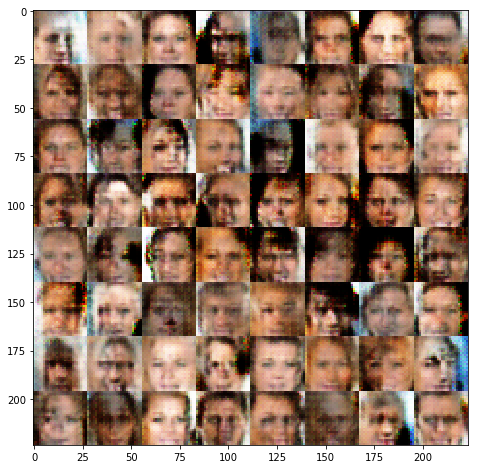

Epoch 1/1... Batch 1105 Discriminator Loss: 1.2730... Generator Loss: 1.1533
Epoch 1/1... Batch 1110 Discriminator Loss: 1.4535... Generator Loss: 1.9301
Epoch 1/1... Batch 1115 Discriminator Loss: 1.0669... Generator Loss: 1.2607
Epoch 1/1... Batch 1120 Discriminator Loss: 0.9170... Generator Loss: 1.0458
Epoch 1/1... Batch 1125 Discriminator Loss: 1.4007... Generator Loss: 0.7575
Epoch 1/1... Batch 1130 Discriminator Loss: 1.2255... Generator Loss: 0.7017
Epoch 1/1... Batch 1135 Discriminator Loss: 1.3411... Generator Loss: 0.6779
Epoch 1/1... Batch 1140 Discriminator Loss: 1.0682... Generator Loss: 0.9147
Epoch 1/1... Batch 1145 Discriminator Loss: 1.6128... Generator Loss: 0.4137
Epoch 1/1... Batch 1150 Discriminator Loss: 1.3367... Generator Loss: 1.0193


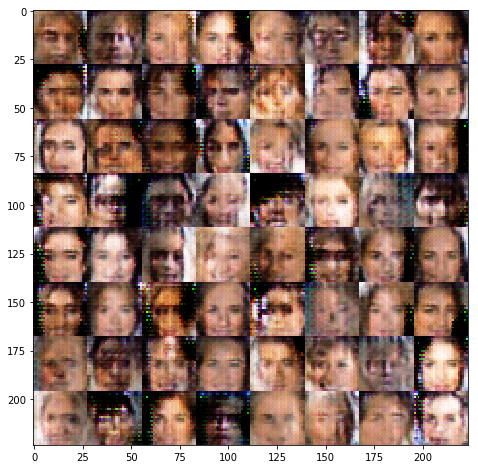

Epoch 1/1... Batch 1155 Discriminator Loss: 1.2044... Generator Loss: 1.1547
Epoch 1/1... Batch 1160 Discriminator Loss: 1.1269... Generator Loss: 1.1973
Epoch 1/1... Batch 1165 Discriminator Loss: 1.0196... Generator Loss: 1.7171
Epoch 1/1... Batch 1170 Discriminator Loss: 1.1221... Generator Loss: 1.0874
Epoch 1/1... Batch 1175 Discriminator Loss: 1.1899... Generator Loss: 0.6965
Epoch 1/1... Batch 1180 Discriminator Loss: 1.5964... Generator Loss: 0.4562
Epoch 1/1... Batch 1185 Discriminator Loss: 1.3131... Generator Loss: 0.8674
Epoch 1/1... Batch 1190 Discriminator Loss: 1.0058... Generator Loss: 1.1039
Epoch 1/1... Batch 1195 Discriminator Loss: 1.3701... Generator Loss: 1.2690
Epoch 1/1... Batch 1200 Discriminator Loss: 1.1739... Generator Loss: 1.0115


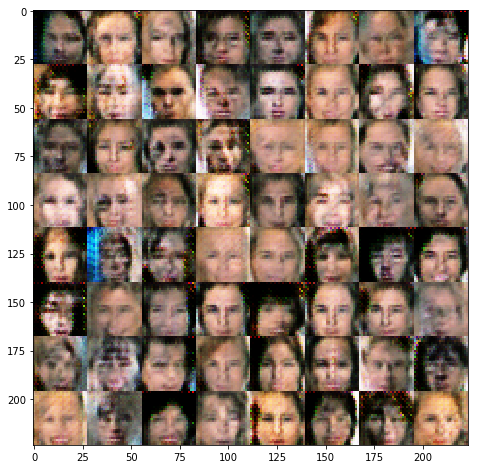

Epoch 1/1... Batch 1205 Discriminator Loss: 0.9480... Generator Loss: 1.0549
Epoch 1/1... Batch 1210 Discriminator Loss: 1.1292... Generator Loss: 0.9232
Epoch 1/1... Batch 1215 Discriminator Loss: 1.1991... Generator Loss: 1.1012
Epoch 1/1... Batch 1220 Discriminator Loss: 1.4174... Generator Loss: 0.5716
Epoch 1/1... Batch 1225 Discriminator Loss: 1.1394... Generator Loss: 1.2656
Epoch 1/1... Batch 1230 Discriminator Loss: 1.1404... Generator Loss: 0.9188
Epoch 1/1... Batch 1235 Discriminator Loss: 1.1778... Generator Loss: 1.2257
Epoch 1/1... Batch 1240 Discriminator Loss: 1.4753... Generator Loss: 0.5084
Epoch 1/1... Batch 1245 Discriminator Loss: 1.5149... Generator Loss: 0.9064
Epoch 1/1... Batch 1250 Discriminator Loss: 1.3043... Generator Loss: 1.3606


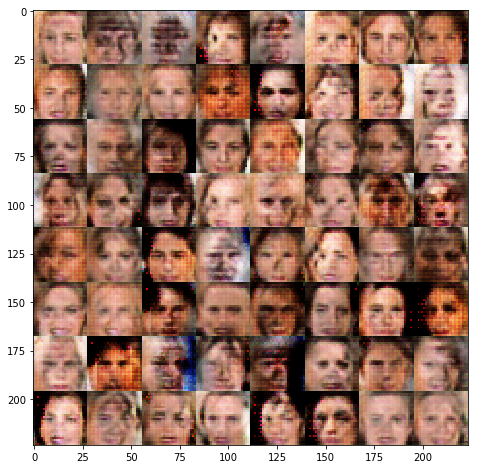

Epoch 1/1... Batch 1255 Discriminator Loss: 1.2183... Generator Loss: 0.8361
Epoch 1/1... Batch 1260 Discriminator Loss: 1.3602... Generator Loss: 1.0816
Epoch 1/1... Batch 1265 Discriminator Loss: 1.2469... Generator Loss: 0.9112
Epoch 1/1... Batch 1270 Discriminator Loss: 1.1805... Generator Loss: 0.7594
Epoch 1/1... Batch 1275 Discriminator Loss: 1.1491... Generator Loss: 1.1172
Epoch 1/1... Batch 1280 Discriminator Loss: 1.1035... Generator Loss: 0.8522
Epoch 1/1... Batch 1285 Discriminator Loss: 1.0543... Generator Loss: 1.2272
Epoch 1/1... Batch 1290 Discriminator Loss: 1.2802... Generator Loss: 0.6406
Epoch 1/1... Batch 1295 Discriminator Loss: 0.7394... Generator Loss: 1.2973
Epoch 1/1... Batch 1300 Discriminator Loss: 1.3078... Generator Loss: 1.2175


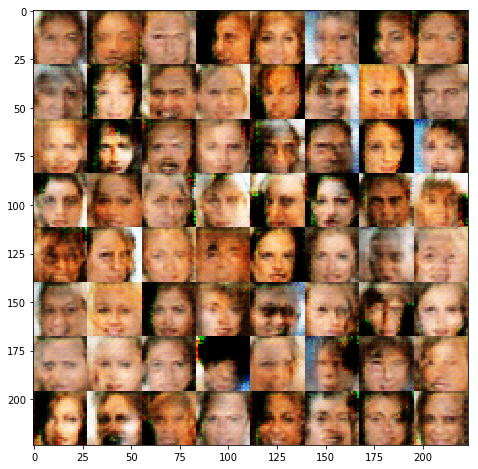

Epoch 1/1... Batch 1305 Discriminator Loss: 1.2485... Generator Loss: 0.6491
Epoch 1/1... Batch 1310 Discriminator Loss: 1.3202... Generator Loss: 0.6892
Epoch 1/1... Batch 1315 Discriminator Loss: 1.0490... Generator Loss: 0.8815
Epoch 1/1... Batch 1320 Discriminator Loss: 1.0770... Generator Loss: 1.0460
Epoch 1/1... Batch 1325 Discriminator Loss: 1.2129... Generator Loss: 0.9430
Epoch 1/1... Batch 1330 Discriminator Loss: 1.2482... Generator Loss: 0.8575
Epoch 1/1... Batch 1335 Discriminator Loss: 1.2061... Generator Loss: 0.9348
Epoch 1/1... Batch 1340 Discriminator Loss: 1.0360... Generator Loss: 1.3149
Epoch 1/1... Batch 1345 Discriminator Loss: 1.3446... Generator Loss: 1.0339
Epoch 1/1... Batch 1350 Discriminator Loss: 0.9559... Generator Loss: 0.9363


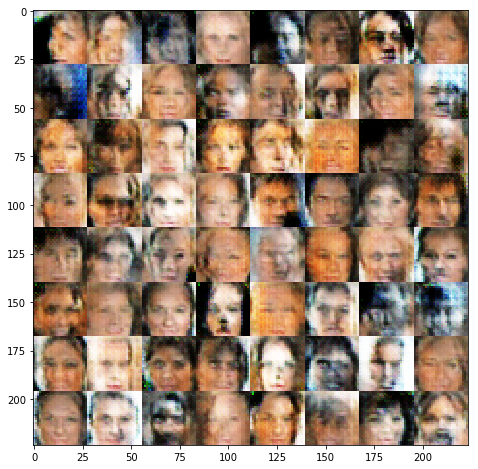

Epoch 1/1... Batch 1355 Discriminator Loss: 1.0774... Generator Loss: 1.2353
Epoch 1/1... Batch 1360 Discriminator Loss: 1.1877... Generator Loss: 1.4170
Epoch 1/1... Batch 1365 Discriminator Loss: 1.1526... Generator Loss: 1.2834
Epoch 1/1... Batch 1370 Discriminator Loss: 1.0570... Generator Loss: 1.0091
Epoch 1/1... Batch 1375 Discriminator Loss: 1.2219... Generator Loss: 0.9957
Epoch 1/1... Batch 1380 Discriminator Loss: 1.2968... Generator Loss: 1.3482
Epoch 1/1... Batch 1385 Discriminator Loss: 1.1496... Generator Loss: 0.7923
Epoch 1/1... Batch 1390 Discriminator Loss: 1.2242... Generator Loss: 1.1307
Epoch 1/1... Batch 1395 Discriminator Loss: 1.0699... Generator Loss: 0.9022
Epoch 1/1... Batch 1400 Discriminator Loss: 1.0299... Generator Loss: 1.3200


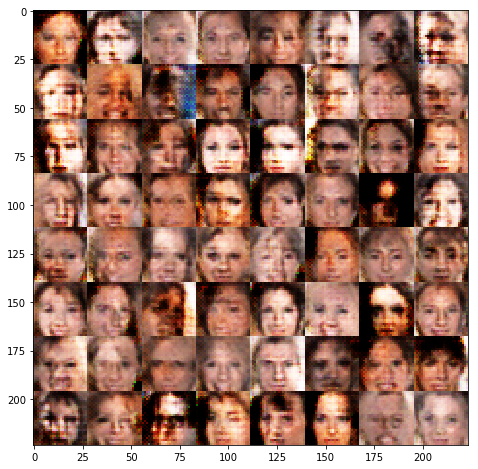

Epoch 1/1... Batch 1405 Discriminator Loss: 1.5102... Generator Loss: 0.8677
Epoch 1/1... Batch 1410 Discriminator Loss: 1.3780... Generator Loss: 0.8878
Epoch 1/1... Batch 1415 Discriminator Loss: 1.1252... Generator Loss: 0.8951
Epoch 1/1... Batch 1420 Discriminator Loss: 1.1696... Generator Loss: 1.5391
Epoch 1/1... Batch 1425 Discriminator Loss: 1.0051... Generator Loss: 1.0237
Epoch 1/1... Batch 1430 Discriminator Loss: 1.2285... Generator Loss: 1.4068
Epoch 1/1... Batch 1435 Discriminator Loss: 1.4333... Generator Loss: 1.2477
Epoch 1/1... Batch 1440 Discriminator Loss: 1.0937... Generator Loss: 0.8796
Epoch 1/1... Batch 1445 Discriminator Loss: 1.4168... Generator Loss: 0.8644
Epoch 1/1... Batch 1450 Discriminator Loss: 1.2262... Generator Loss: 0.8431


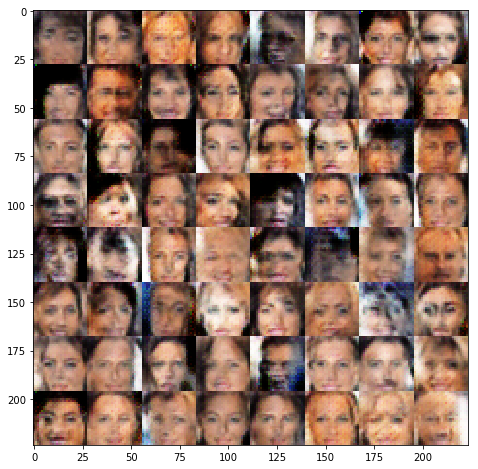

Epoch 1/1... Batch 1455 Discriminator Loss: 1.1945... Generator Loss: 0.7073
Epoch 1/1... Batch 1460 Discriminator Loss: 1.1338... Generator Loss: 0.9260
Epoch 1/1... Batch 1465 Discriminator Loss: 0.9043... Generator Loss: 0.9896
Epoch 1/1... Batch 1470 Discriminator Loss: 1.2530... Generator Loss: 0.5801
Epoch 1/1... Batch 1475 Discriminator Loss: 1.0141... Generator Loss: 0.9303
Epoch 1/1... Batch 1480 Discriminator Loss: 1.0747... Generator Loss: 1.1157
Epoch 1/1... Batch 1485 Discriminator Loss: 1.0749... Generator Loss: 0.8101
Epoch 1/1... Batch 1490 Discriminator Loss: 1.4894... Generator Loss: 1.6501
Epoch 1/1... Batch 1495 Discriminator Loss: 1.1550... Generator Loss: 0.9976
Epoch 1/1... Batch 1500 Discriminator Loss: 1.3196... Generator Loss: 1.3370


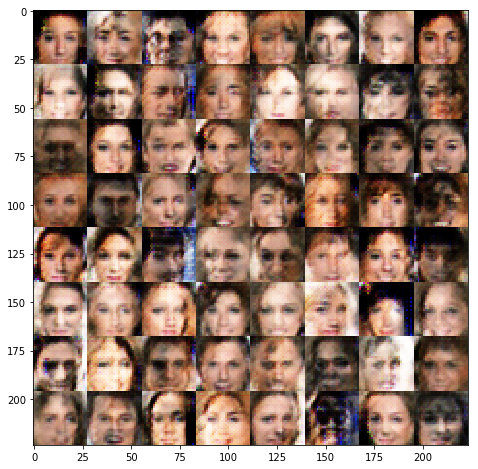

Epoch 1/1... Batch 1505 Discriminator Loss: 1.0750... Generator Loss: 1.0078
Epoch 1/1... Batch 1510 Discriminator Loss: 1.1981... Generator Loss: 0.8103
Epoch 1/1... Batch 1515 Discriminator Loss: 1.2720... Generator Loss: 1.0271
Epoch 1/1... Batch 1520 Discriminator Loss: 1.1248... Generator Loss: 0.9008
Epoch 1/1... Batch 1525 Discriminator Loss: 1.1852... Generator Loss: 0.6748
Epoch 1/1... Batch 1530 Discriminator Loss: 1.1110... Generator Loss: 1.1338
Epoch 1/1... Batch 1535 Discriminator Loss: 1.2773... Generator Loss: 0.7552
Epoch 1/1... Batch 1540 Discriminator Loss: 1.1388... Generator Loss: 1.1269
Epoch 1/1... Batch 1545 Discriminator Loss: 1.3706... Generator Loss: 0.5731
Epoch 1/1... Batch 1550 Discriminator Loss: 0.9983... Generator Loss: 1.2619


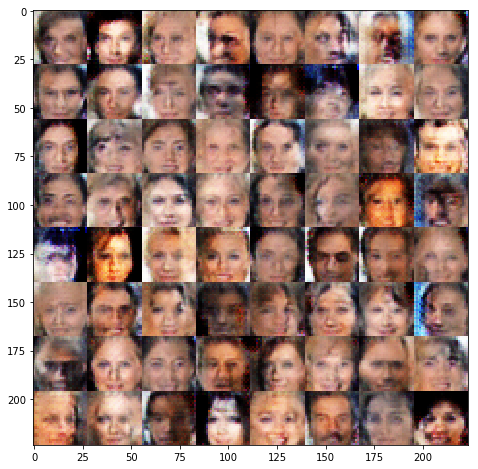

Epoch 1/1... Batch 1555 Discriminator Loss: 1.5356... Generator Loss: 0.5923
Epoch 1/1... Batch 1560 Discriminator Loss: 1.1972... Generator Loss: 1.1448
Epoch 1/1... Batch 1565 Discriminator Loss: 1.0615... Generator Loss: 0.8500
Epoch 1/1... Batch 1570 Discriminator Loss: 1.0189... Generator Loss: 0.9300
Epoch 1/1... Batch 1575 Discriminator Loss: 1.2750... Generator Loss: 0.7751
Epoch 1/1... Batch 1580 Discriminator Loss: 1.1688... Generator Loss: 0.9520
Epoch 1/1... Batch 1585 Discriminator Loss: 1.2185... Generator Loss: 0.9339
Epoch 1/1... Batch 1590 Discriminator Loss: 1.0684... Generator Loss: 0.9845
Epoch 1/1... Batch 1595 Discriminator Loss: 0.9644... Generator Loss: 1.1487
Epoch 1/1... Batch 1600 Discriminator Loss: 1.2109... Generator Loss: 0.6392


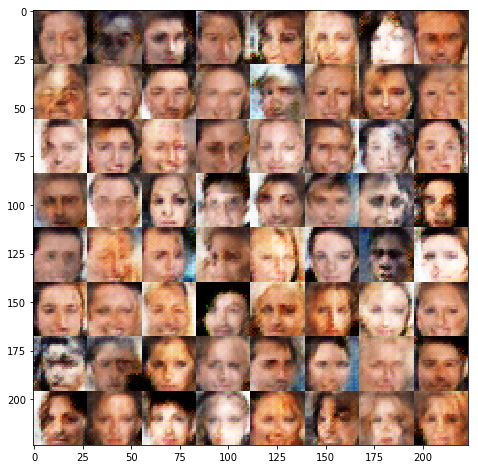

Epoch 1/1... Batch 1605 Discriminator Loss: 0.9777... Generator Loss: 1.0087
Epoch 1/1... Batch 1610 Discriminator Loss: 1.2917... Generator Loss: 1.1304
Epoch 1/1... Batch 1615 Discriminator Loss: 1.1784... Generator Loss: 0.7725
Epoch 1/1... Batch 1620 Discriminator Loss: 1.0232... Generator Loss: 0.9652
Epoch 1/1... Batch 1625 Discriminator Loss: 1.2421... Generator Loss: 0.9432
Epoch 1/1... Batch 1630 Discriminator Loss: 0.9885... Generator Loss: 1.2530
Epoch 1/1... Batch 1635 Discriminator Loss: 1.0103... Generator Loss: 1.0033
Epoch 1/1... Batch 1640 Discriminator Loss: 1.2104... Generator Loss: 0.7807
Epoch 1/1... Batch 1645 Discriminator Loss: 1.0516... Generator Loss: 1.0190
Epoch 1/1... Batch 1650 Discriminator Loss: 0.9647... Generator Loss: 1.0012


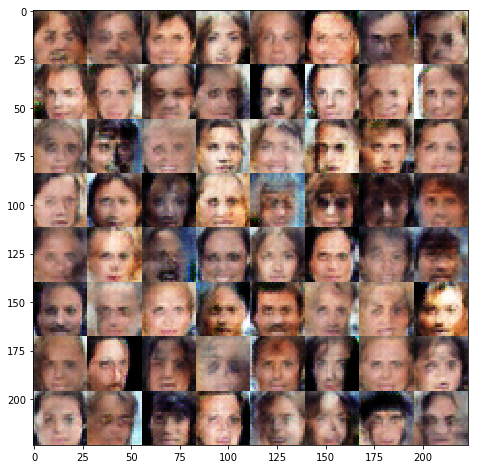

Epoch 1/1... Batch 1655 Discriminator Loss: 0.7949... Generator Loss: 1.5372
Epoch 1/1... Batch 1660 Discriminator Loss: 1.2730... Generator Loss: 0.7833
Epoch 1/1... Batch 1665 Discriminator Loss: 1.3482... Generator Loss: 1.0455
Epoch 1/1... Batch 1670 Discriminator Loss: 1.4020... Generator Loss: 1.6963
Epoch 1/1... Batch 1675 Discriminator Loss: 1.1876... Generator Loss: 1.1371
Epoch 1/1... Batch 1680 Discriminator Loss: 1.0717... Generator Loss: 1.0010
Epoch 1/1... Batch 1685 Discriminator Loss: 1.2784... Generator Loss: 0.8378
Epoch 1/1... Batch 1690 Discriminator Loss: 1.2906... Generator Loss: 0.8255
Epoch 1/1... Batch 1695 Discriminator Loss: 1.5957... Generator Loss: 0.4737
Epoch 1/1... Batch 1700 Discriminator Loss: 1.0877... Generator Loss: 1.1181


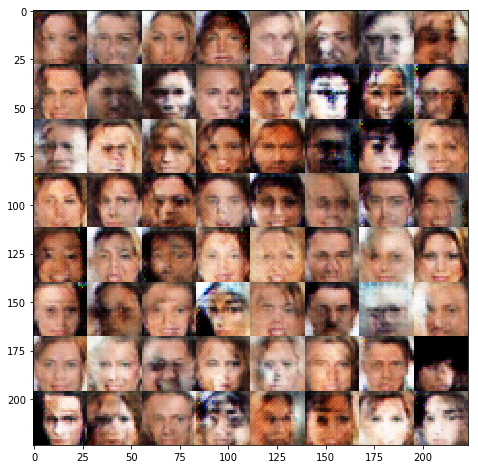

Epoch 1/1... Batch 1705 Discriminator Loss: 1.0813... Generator Loss: 0.8440
Epoch 1/1... Batch 1710 Discriminator Loss: 1.3358... Generator Loss: 1.0845
Epoch 1/1... Batch 1715 Discriminator Loss: 1.1222... Generator Loss: 0.9059
Epoch 1/1... Batch 1720 Discriminator Loss: 1.0531... Generator Loss: 0.9379
Epoch 1/1... Batch 1725 Discriminator Loss: 1.6987... Generator Loss: 1.9372
Epoch 1/1... Batch 1730 Discriminator Loss: 1.3266... Generator Loss: 1.2982
Epoch 1/1... Batch 1735 Discriminator Loss: 1.0703... Generator Loss: 0.9172
Epoch 1/1... Batch 1740 Discriminator Loss: 1.2756... Generator Loss: 0.9093
Epoch 1/1... Batch 1745 Discriminator Loss: 1.1325... Generator Loss: 0.8034
Epoch 1/1... Batch 1750 Discriminator Loss: 1.1904... Generator Loss: 0.8600


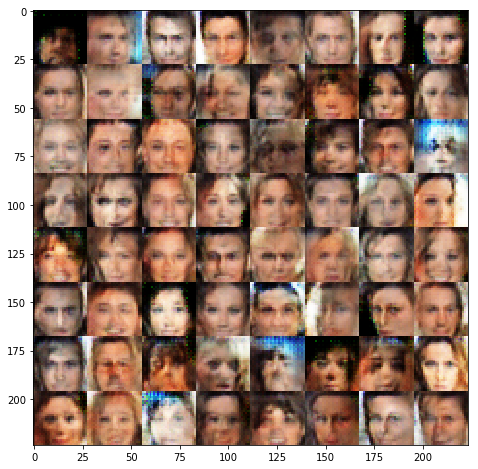

Epoch 1/1... Batch 1755 Discriminator Loss: 1.3744... Generator Loss: 0.8290
Epoch 1/1... Batch 1760 Discriminator Loss: 1.2591... Generator Loss: 0.8868
Epoch 1/1... Batch 1765 Discriminator Loss: 1.4519... Generator Loss: 0.7860
Epoch 1/1... Batch 1770 Discriminator Loss: 1.1297... Generator Loss: 1.1614
Epoch 1/1... Batch 1775 Discriminator Loss: 1.2143... Generator Loss: 0.6978
Epoch 1/1... Batch 1780 Discriminator Loss: 1.3432... Generator Loss: 1.0062
Epoch 1/1... Batch 1785 Discriminator Loss: 1.2167... Generator Loss: 0.8499
Epoch 1/1... Batch 1790 Discriminator Loss: 1.1246... Generator Loss: 0.8452
Epoch 1/1... Batch 1795 Discriminator Loss: 1.4433... Generator Loss: 0.5903
Epoch 1/1... Batch 1800 Discriminator Loss: 1.1688... Generator Loss: 0.8737


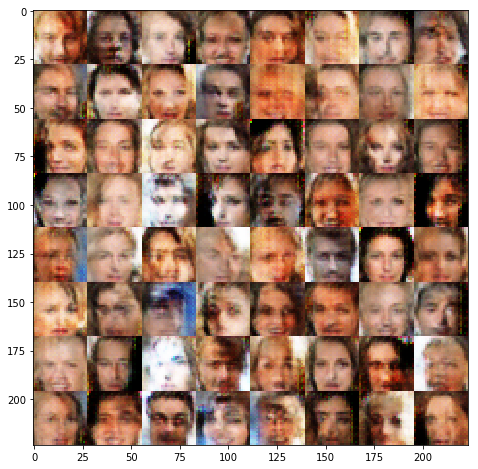

Epoch 1/1... Batch 1805 Discriminator Loss: 1.1786... Generator Loss: 0.7430
Epoch 1/1... Batch 1810 Discriminator Loss: 1.2446... Generator Loss: 0.7737
Epoch 1/1... Batch 1815 Discriminator Loss: 1.3187... Generator Loss: 1.2549
Epoch 1/1... Batch 1820 Discriminator Loss: 1.1643... Generator Loss: 1.0591
Epoch 1/1... Batch 1825 Discriminator Loss: 1.1266... Generator Loss: 0.9629
Epoch 1/1... Batch 1830 Discriminator Loss: 1.1505... Generator Loss: 0.7163
Epoch 1/1... Batch 1835 Discriminator Loss: 1.3534... Generator Loss: 1.3477
Epoch 1/1... Batch 1840 Discriminator Loss: 1.1720... Generator Loss: 0.9213
Epoch 1/1... Batch 1845 Discriminator Loss: 1.1477... Generator Loss: 0.9926
Epoch 1/1... Batch 1850 Discriminator Loss: 1.0645... Generator Loss: 0.8147


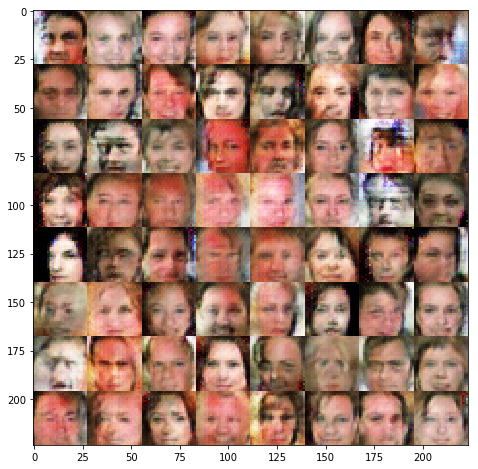

Epoch 1/1... Batch 1855 Discriminator Loss: 1.1474... Generator Loss: 0.8370
Epoch 1/1... Batch 1860 Discriminator Loss: 1.2349... Generator Loss: 0.8003
Epoch 1/1... Batch 1865 Discriminator Loss: 1.1873... Generator Loss: 1.0772
Epoch 1/1... Batch 1870 Discriminator Loss: 1.1816... Generator Loss: 0.9730
Epoch 1/1... Batch 1875 Discriminator Loss: 0.9029... Generator Loss: 1.1702
Epoch 1/1... Batch 1880 Discriminator Loss: 1.3407... Generator Loss: 0.6635
Epoch 1/1... Batch 1885 Discriminator Loss: 1.5887... Generator Loss: 2.1569
Epoch 1/1... Batch 1890 Discriminator Loss: 1.3035... Generator Loss: 0.8455
Epoch 1/1... Batch 1895 Discriminator Loss: 0.9337... Generator Loss: 1.0489
Epoch 1/1... Batch 1900 Discriminator Loss: 1.1829... Generator Loss: 1.2676


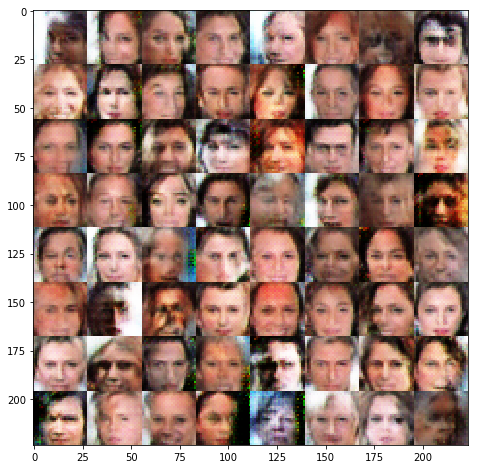

Epoch 1/1... Batch 1905 Discriminator Loss: 1.2791... Generator Loss: 0.6295
Epoch 1/1... Batch 1910 Discriminator Loss: 1.1624... Generator Loss: 0.8508
Epoch 1/1... Batch 1915 Discriminator Loss: 1.2119... Generator Loss: 1.0745
Epoch 1/1... Batch 1920 Discriminator Loss: 1.1187... Generator Loss: 0.7910
Epoch 1/1... Batch 1925 Discriminator Loss: 1.2853... Generator Loss: 1.2173
Epoch 1/1... Batch 1930 Discriminator Loss: 1.2123... Generator Loss: 0.6312
Epoch 1/1... Batch 1935 Discriminator Loss: 1.2310... Generator Loss: 0.8549
Epoch 1/1... Batch 1940 Discriminator Loss: 1.2926... Generator Loss: 0.8765
Epoch 1/1... Batch 1945 Discriminator Loss: 1.4225... Generator Loss: 1.5040
Epoch 1/1... Batch 1950 Discriminator Loss: 0.9781... Generator Loss: 0.8946


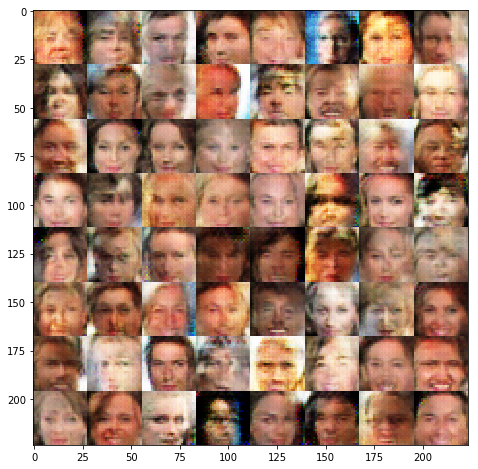

Epoch 1/1... Batch 1955 Discriminator Loss: 1.3996... Generator Loss: 0.9014
Epoch 1/1... Batch 1960 Discriminator Loss: 1.3362... Generator Loss: 0.7202
Epoch 1/1... Batch 1965 Discriminator Loss: 1.2323... Generator Loss: 1.1290
Epoch 1/1... Batch 1970 Discriminator Loss: 1.1649... Generator Loss: 1.0463
Epoch 1/1... Batch 1975 Discriminator Loss: 1.1904... Generator Loss: 0.7731
Epoch 1/1... Batch 1980 Discriminator Loss: 1.2748... Generator Loss: 0.8426
Epoch 1/1... Batch 1985 Discriminator Loss: 1.1212... Generator Loss: 0.8627
Epoch 1/1... Batch 1990 Discriminator Loss: 1.4211... Generator Loss: 0.4875
Epoch 1/1... Batch 1995 Discriminator Loss: 1.0940... Generator Loss: 0.8683
Epoch 1/1... Batch 2000 Discriminator Loss: 1.3291... Generator Loss: 1.3074


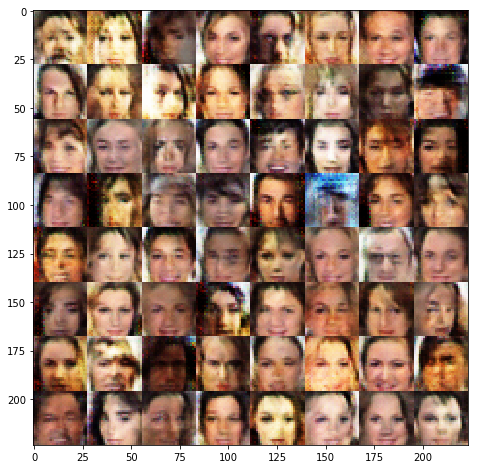

Epoch 1/1... Batch 2005 Discriminator Loss: 1.3114... Generator Loss: 0.7513
Epoch 1/1... Batch 2010 Discriminator Loss: 1.2352... Generator Loss: 1.3812
Epoch 1/1... Batch 2015 Discriminator Loss: 1.0724... Generator Loss: 0.7571
Epoch 1/1... Batch 2020 Discriminator Loss: 1.3172... Generator Loss: 0.7050
Epoch 1/1... Batch 2025 Discriminator Loss: 1.2168... Generator Loss: 0.9571
Epoch 1/1... Batch 2030 Discriminator Loss: 1.2940... Generator Loss: 1.1013
Epoch 1/1... Batch 2035 Discriminator Loss: 1.2398... Generator Loss: 0.9031
Epoch 1/1... Batch 2040 Discriminator Loss: 1.1632... Generator Loss: 1.0407
Epoch 1/1... Batch 2045 Discriminator Loss: 1.2721... Generator Loss: 0.7452
Epoch 1/1... Batch 2050 Discriminator Loss: 1.1479... Generator Loss: 0.8876


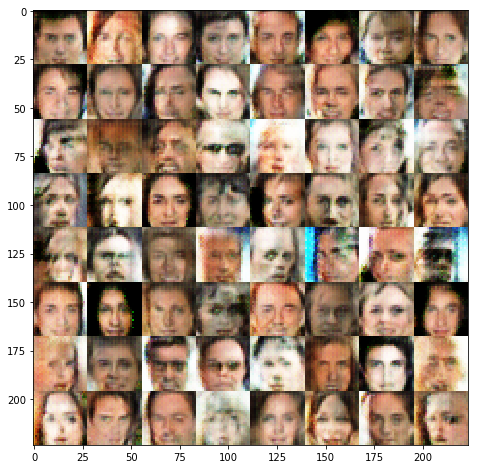

Epoch 1/1... Batch 2055 Discriminator Loss: 1.1199... Generator Loss: 1.0218
Epoch 1/1... Batch 2060 Discriminator Loss: 1.1609... Generator Loss: 0.7332
Epoch 1/1... Batch 2065 Discriminator Loss: 1.3462... Generator Loss: 0.7556
Epoch 1/1... Batch 2070 Discriminator Loss: 1.2387... Generator Loss: 0.8654
Epoch 1/1... Batch 2075 Discriminator Loss: 0.8726... Generator Loss: 1.1178
Epoch 1/1... Batch 2080 Discriminator Loss: 2.3498... Generator Loss: 2.4914
Epoch 1/1... Batch 2085 Discriminator Loss: 1.1218... Generator Loss: 1.1064
Epoch 1/1... Batch 2090 Discriminator Loss: 1.3046... Generator Loss: 0.7516
Epoch 1/1... Batch 2095 Discriminator Loss: 1.2924... Generator Loss: 0.5687
Epoch 1/1... Batch 2100 Discriminator Loss: 1.1918... Generator Loss: 1.0412


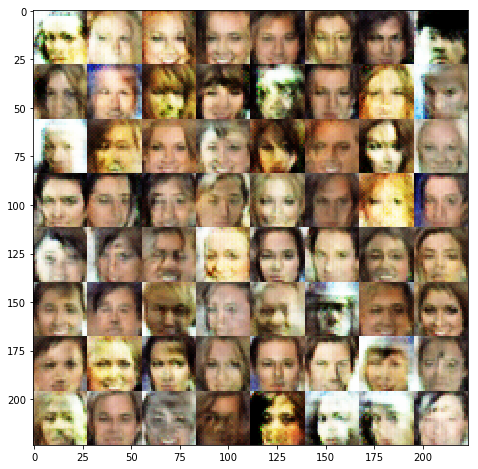

Epoch 1/1... Batch 2105 Discriminator Loss: 1.2273... Generator Loss: 0.8926
Epoch 1/1... Batch 2110 Discriminator Loss: 1.1152... Generator Loss: 1.3005
Epoch 1/1... Batch 2115 Discriminator Loss: 0.9954... Generator Loss: 0.8721
Epoch 1/1... Batch 2120 Discriminator Loss: 1.3856... Generator Loss: 0.5340
Epoch 1/1... Batch 2125 Discriminator Loss: 1.1068... Generator Loss: 0.9692
Epoch 1/1... Batch 2130 Discriminator Loss: 1.1732... Generator Loss: 0.9424
Epoch 1/1... Batch 2135 Discriminator Loss: 1.2088... Generator Loss: 0.7498
Epoch 1/1... Batch 2140 Discriminator Loss: 1.0023... Generator Loss: 0.9020
Epoch 1/1... Batch 2145 Discriminator Loss: 1.1677... Generator Loss: 0.6820
Epoch 1/1... Batch 2150 Discriminator Loss: 1.1637... Generator Loss: 0.8995


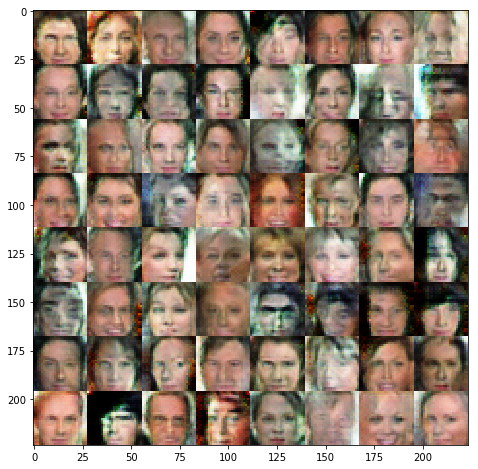

Epoch 1/1... Batch 2155 Discriminator Loss: 1.1499... Generator Loss: 0.8100
Epoch 1/1... Batch 2160 Discriminator Loss: 1.0913... Generator Loss: 0.9597
Epoch 1/1... Batch 2165 Discriminator Loss: 1.0383... Generator Loss: 0.8177
Epoch 1/1... Batch 2170 Discriminator Loss: 1.3350... Generator Loss: 1.0777
Epoch 1/1... Batch 2175 Discriminator Loss: 1.1261... Generator Loss: 0.8520
Epoch 1/1... Batch 2180 Discriminator Loss: 1.1693... Generator Loss: 0.9168
Epoch 1/1... Batch 2185 Discriminator Loss: 1.0913... Generator Loss: 0.7293
Epoch 1/1... Batch 2190 Discriminator Loss: 1.1183... Generator Loss: 1.0047
Epoch 1/1... Batch 2195 Discriminator Loss: 1.6824... Generator Loss: 1.7621
Epoch 1/1... Batch 2200 Discriminator Loss: 1.0779... Generator Loss: 0.9562


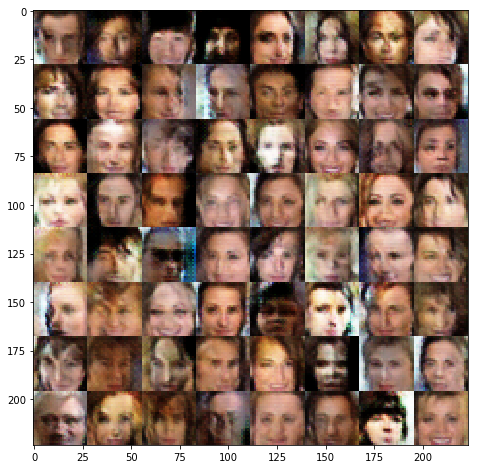

Epoch 1/1... Batch 2205 Discriminator Loss: 1.0431... Generator Loss: 0.9399
Epoch 1/1... Batch 2210 Discriminator Loss: 1.2661... Generator Loss: 0.7279
Epoch 1/1... Batch 2215 Discriminator Loss: 1.2161... Generator Loss: 0.8483
Epoch 1/1... Batch 2220 Discriminator Loss: 1.0686... Generator Loss: 1.0785
Epoch 1/1... Batch 2225 Discriminator Loss: 1.0414... Generator Loss: 0.8841
Epoch 1/1... Batch 2230 Discriminator Loss: 1.2066... Generator Loss: 0.6995
Epoch 1/1... Batch 2235 Discriminator Loss: 1.3529... Generator Loss: 0.9241
Epoch 1/1... Batch 2240 Discriminator Loss: 1.0698... Generator Loss: 0.9494
Epoch 1/1... Batch 2245 Discriminator Loss: 0.9783... Generator Loss: 0.9609
Epoch 1/1... Batch 2250 Discriminator Loss: 1.3872... Generator Loss: 0.9620


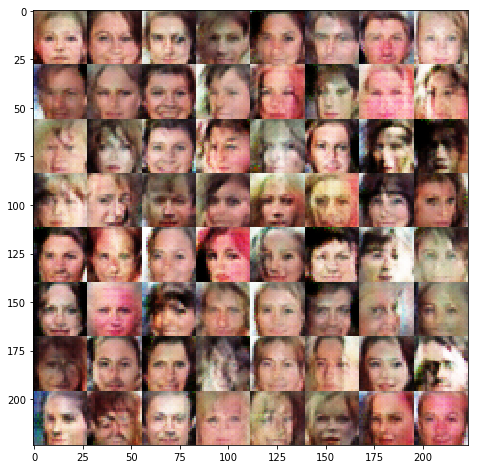

Epoch 1/1... Batch 2255 Discriminator Loss: 1.3337... Generator Loss: 0.5982
Epoch 1/1... Batch 2260 Discriminator Loss: 1.2517... Generator Loss: 0.8448
Epoch 1/1... Batch 2265 Discriminator Loss: 1.1943... Generator Loss: 0.7884
Epoch 1/1... Batch 2270 Discriminator Loss: 1.2133... Generator Loss: 1.0516
Epoch 1/1... Batch 2275 Discriminator Loss: 1.1135... Generator Loss: 0.8975
Epoch 1/1... Batch 2280 Discriminator Loss: 1.0326... Generator Loss: 0.7747
Epoch 1/1... Batch 2285 Discriminator Loss: 1.2241... Generator Loss: 0.7176
Epoch 1/1... Batch 2290 Discriminator Loss: 1.3172... Generator Loss: 0.5720
Epoch 1/1... Batch 2295 Discriminator Loss: 1.3395... Generator Loss: 0.6356
Epoch 1/1... Batch 2300 Discriminator Loss: 1.3469... Generator Loss: 0.7571


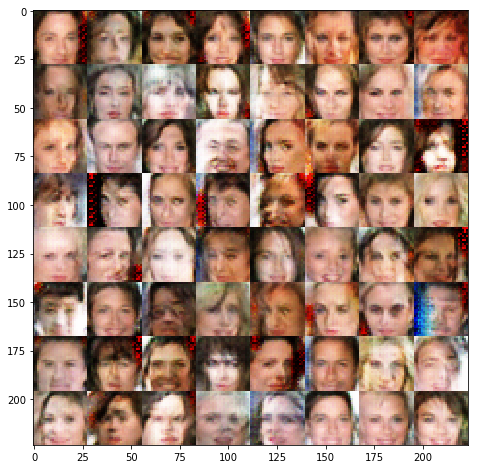

Epoch 1/1... Batch 2305 Discriminator Loss: 1.0287... Generator Loss: 1.1528
Epoch 1/1... Batch 2310 Discriminator Loss: 1.1803... Generator Loss: 0.7886
Epoch 1/1... Batch 2315 Discriminator Loss: 1.2416... Generator Loss: 1.0110
Epoch 1/1... Batch 2320 Discriminator Loss: 1.0894... Generator Loss: 0.7090
Epoch 1/1... Batch 2325 Discriminator Loss: 1.2764... Generator Loss: 0.6289
Epoch 1/1... Batch 2330 Discriminator Loss: 1.2504... Generator Loss: 0.9321
Epoch 1/1... Batch 2335 Discriminator Loss: 1.1157... Generator Loss: 0.8852
Epoch 1/1... Batch 2340 Discriminator Loss: 1.2898... Generator Loss: 0.6207
Epoch 1/1... Batch 2345 Discriminator Loss: 1.1128... Generator Loss: 1.0181
Epoch 1/1... Batch 2350 Discriminator Loss: 1.1682... Generator Loss: 1.2444


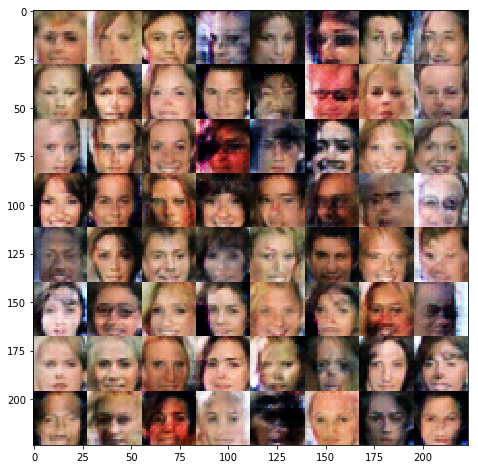

Epoch 1/1... Batch 2355 Discriminator Loss: 1.1597... Generator Loss: 1.1064
Epoch 1/1... Batch 2360 Discriminator Loss: 1.3846... Generator Loss: 0.5778
Epoch 1/1... Batch 2365 Discriminator Loss: 1.2796... Generator Loss: 0.7825
Epoch 1/1... Batch 2370 Discriminator Loss: 1.2932... Generator Loss: 0.9361
Epoch 1/1... Batch 2375 Discriminator Loss: 1.0389... Generator Loss: 1.1548
Epoch 1/1... Batch 2380 Discriminator Loss: 1.2646... Generator Loss: 0.7319
Epoch 1/1... Batch 2385 Discriminator Loss: 1.1156... Generator Loss: 0.8735
Epoch 1/1... Batch 2390 Discriminator Loss: 1.1169... Generator Loss: 0.8140
Epoch 1/1... Batch 2395 Discriminator Loss: 1.2911... Generator Loss: 0.7474
Epoch 1/1... Batch 2400 Discriminator Loss: 1.1641... Generator Loss: 0.8742


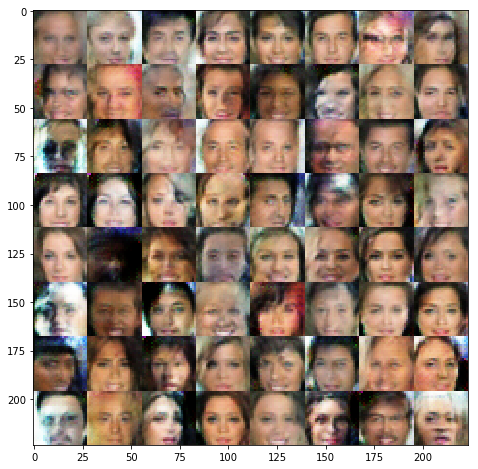

Epoch 1/1... Batch 2405 Discriminator Loss: 1.3902... Generator Loss: 1.2724
Epoch 1/1... Batch 2410 Discriminator Loss: 1.1167... Generator Loss: 0.7965
Epoch 1/1... Batch 2415 Discriminator Loss: 1.2459... Generator Loss: 0.9657
Epoch 1/1... Batch 2420 Discriminator Loss: 1.4964... Generator Loss: 0.7929
Epoch 1/1... Batch 2425 Discriminator Loss: 1.0927... Generator Loss: 0.8613
Epoch 1/1... Batch 2430 Discriminator Loss: 1.4657... Generator Loss: 1.6584
Epoch 1/1... Batch 2435 Discriminator Loss: 1.4268... Generator Loss: 0.5249
Epoch 1/1... Batch 2440 Discriminator Loss: 1.0387... Generator Loss: 1.2464
Epoch 1/1... Batch 2445 Discriminator Loss: 1.3842... Generator Loss: 0.5596
Epoch 1/1... Batch 2450 Discriminator Loss: 1.3995... Generator Loss: 0.9810


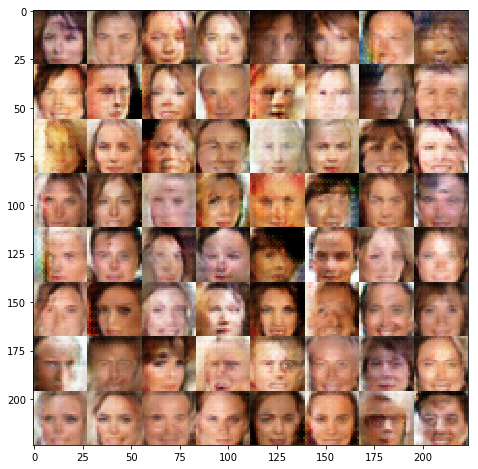

Epoch 1/1... Batch 2455 Discriminator Loss: 1.2006... Generator Loss: 0.7676
Epoch 1/1... Batch 2460 Discriminator Loss: 1.4789... Generator Loss: 1.2722
Epoch 1/1... Batch 2465 Discriminator Loss: 1.0783... Generator Loss: 0.8940
Epoch 1/1... Batch 2470 Discriminator Loss: 1.1114... Generator Loss: 0.8023
Epoch 1/1... Batch 2475 Discriminator Loss: 1.2629... Generator Loss: 0.8018
Epoch 1/1... Batch 2480 Discriminator Loss: 1.0823... Generator Loss: 0.8208
Epoch 1/1... Batch 2485 Discriminator Loss: 0.8646... Generator Loss: 1.0375
Epoch 1/1... Batch 2490 Discriminator Loss: 1.1083... Generator Loss: 0.8040
Epoch 1/1... Batch 2495 Discriminator Loss: 1.2668... Generator Loss: 0.8514
Epoch 1/1... Batch 2500 Discriminator Loss: 1.4301... Generator Loss: 0.8814


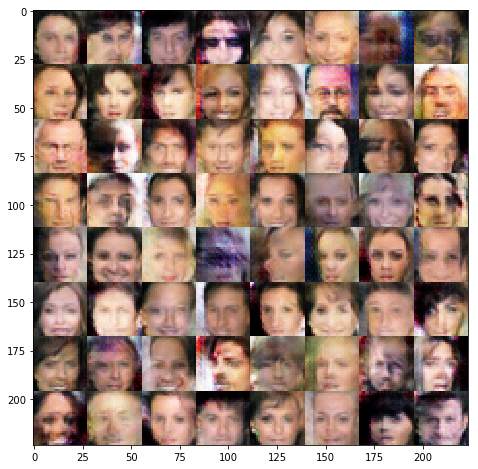

Epoch 1/1... Batch 2505 Discriminator Loss: 1.1313... Generator Loss: 1.1837
Epoch 1/1... Batch 2510 Discriminator Loss: 1.1768... Generator Loss: 0.7220
Epoch 1/1... Batch 2515 Discriminator Loss: 1.0138... Generator Loss: 1.1330
Epoch 1/1... Batch 2520 Discriminator Loss: 1.2429... Generator Loss: 0.6169
Epoch 1/1... Batch 2525 Discriminator Loss: 1.1375... Generator Loss: 1.0006
Epoch 1/1... Batch 2530 Discriminator Loss: 1.1984... Generator Loss: 0.8762
Epoch 1/1... Batch 2535 Discriminator Loss: 1.1843... Generator Loss: 0.8558
Epoch 1/1... Batch 2540 Discriminator Loss: 1.0406... Generator Loss: 0.8392
Epoch 1/1... Batch 2545 Discriminator Loss: 1.3205... Generator Loss: 0.8921
Epoch 1/1... Batch 2550 Discriminator Loss: 1.2275... Generator Loss: 1.0083


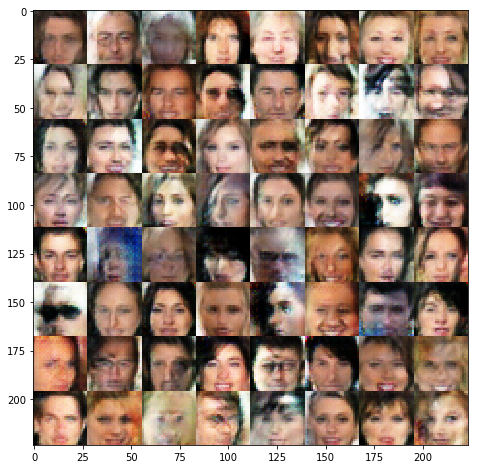

Epoch 1/1... Batch 2555 Discriminator Loss: 1.0418... Generator Loss: 1.0536
Epoch 1/1... Batch 2560 Discriminator Loss: 1.0771... Generator Loss: 0.9133
Epoch 1/1... Batch 2565 Discriminator Loss: 1.2108... Generator Loss: 1.2100
Epoch 1/1... Batch 2570 Discriminator Loss: 1.1500... Generator Loss: 0.8338
Epoch 1/1... Batch 2575 Discriminator Loss: 1.0736... Generator Loss: 0.9279
Epoch 1/1... Batch 2580 Discriminator Loss: 1.3966... Generator Loss: 0.6792
Epoch 1/1... Batch 2585 Discriminator Loss: 1.1178... Generator Loss: 0.7172
Epoch 1/1... Batch 2590 Discriminator Loss: 0.9602... Generator Loss: 1.0004
Epoch 1/1... Batch 2595 Discriminator Loss: 1.1810... Generator Loss: 0.9569
Epoch 1/1... Batch 2600 Discriminator Loss: 1.2433... Generator Loss: 1.0078


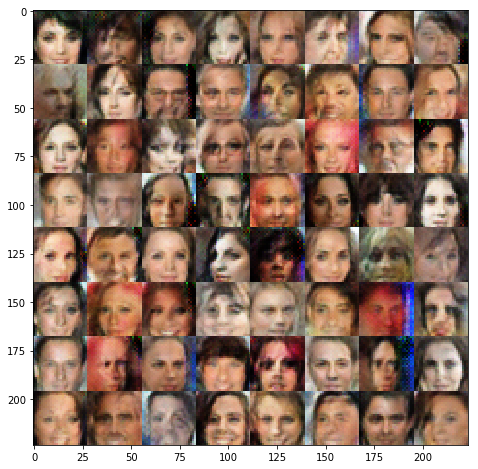

Epoch 1/1... Batch 2605 Discriminator Loss: 1.3224... Generator Loss: 0.7882
Epoch 1/1... Batch 2610 Discriminator Loss: 1.0880... Generator Loss: 0.9945
Epoch 1/1... Batch 2615 Discriminator Loss: 1.1852... Generator Loss: 0.8446
Epoch 1/1... Batch 2620 Discriminator Loss: 1.2997... Generator Loss: 1.3644
Epoch 1/1... Batch 2625 Discriminator Loss: 1.2664... Generator Loss: 0.8287
Epoch 1/1... Batch 2630 Discriminator Loss: 1.1329... Generator Loss: 0.7630
Epoch 1/1... Batch 2635 Discriminator Loss: 1.1741... Generator Loss: 0.9069
Epoch 1/1... Batch 2640 Discriminator Loss: 1.4656... Generator Loss: 0.6891
Epoch 1/1... Batch 2645 Discriminator Loss: 1.1613... Generator Loss: 1.0246
Epoch 1/1... Batch 2650 Discriminator Loss: 1.1166... Generator Loss: 0.8479


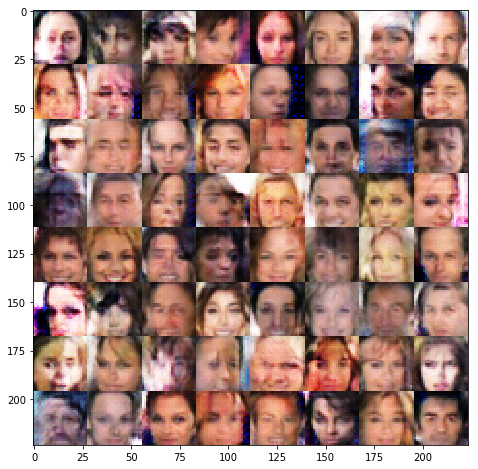

Epoch 1/1... Batch 2655 Discriminator Loss: 1.1473... Generator Loss: 0.6912
Epoch 1/1... Batch 2660 Discriminator Loss: 1.2958... Generator Loss: 1.4115
Epoch 1/1... Batch 2665 Discriminator Loss: 1.1981... Generator Loss: 0.8012
Epoch 1/1... Batch 2670 Discriminator Loss: 1.1595... Generator Loss: 0.8518
Epoch 1/1... Batch 2675 Discriminator Loss: 1.2325... Generator Loss: 0.6296
Epoch 1/1... Batch 2680 Discriminator Loss: 1.1434... Generator Loss: 0.9247
Epoch 1/1... Batch 2685 Discriminator Loss: 1.0669... Generator Loss: 1.0421
Epoch 1/1... Batch 2690 Discriminator Loss: 1.1242... Generator Loss: 0.9140
Epoch 1/1... Batch 2695 Discriminator Loss: 1.2767... Generator Loss: 1.0360
Epoch 1/1... Batch 2700 Discriminator Loss: 1.2432... Generator Loss: 0.8994


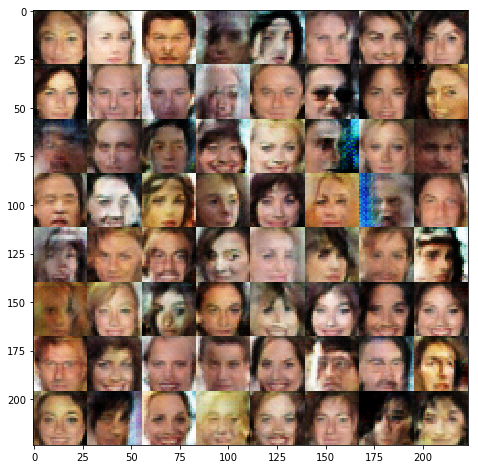

Epoch 1/1... Batch 2705 Discriminator Loss: 1.1075... Generator Loss: 1.0228
Epoch 1/1... Batch 2710 Discriminator Loss: 1.1866... Generator Loss: 0.8681
Epoch 1/1... Batch 2715 Discriminator Loss: 1.4975... Generator Loss: 0.4792
Epoch 1/1... Batch 2720 Discriminator Loss: 1.1260... Generator Loss: 0.9141
Epoch 1/1... Batch 2725 Discriminator Loss: 1.2833... Generator Loss: 0.5927
Epoch 1/1... Batch 2730 Discriminator Loss: 1.1870... Generator Loss: 0.8560
Epoch 1/1... Batch 2735 Discriminator Loss: 1.3718... Generator Loss: 1.0098
Epoch 1/1... Batch 2740 Discriminator Loss: 1.1768... Generator Loss: 0.9222
Epoch 1/1... Batch 2745 Discriminator Loss: 1.1072... Generator Loss: 1.0677
Epoch 1/1... Batch 2750 Discriminator Loss: 1.0553... Generator Loss: 0.9470


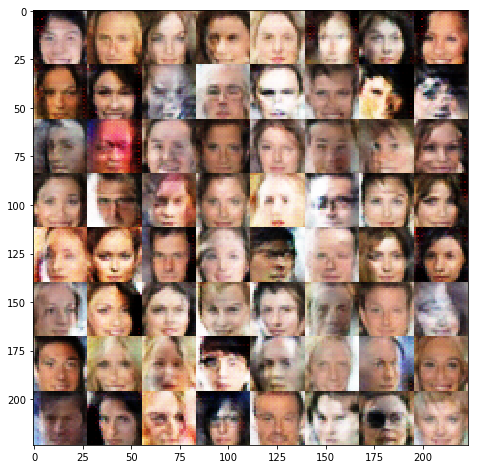

Epoch 1/1... Batch 2755 Discriminator Loss: 1.2681... Generator Loss: 0.9373
Epoch 1/1... Batch 2760 Discriminator Loss: 1.3571... Generator Loss: 0.8750
Epoch 1/1... Batch 2765 Discriminator Loss: 1.4306... Generator Loss: 1.0701
Epoch 1/1... Batch 2770 Discriminator Loss: 1.2666... Generator Loss: 0.9934
Epoch 1/1... Batch 2775 Discriminator Loss: 1.1294... Generator Loss: 0.8427
Epoch 1/1... Batch 2780 Discriminator Loss: 1.2072... Generator Loss: 0.9364
Epoch 1/1... Batch 2785 Discriminator Loss: 1.0829... Generator Loss: 0.8369
Epoch 1/1... Batch 2790 Discriminator Loss: 1.2077... Generator Loss: 0.8898
Epoch 1/1... Batch 2795 Discriminator Loss: 1.2677... Generator Loss: 1.3039
Epoch 1/1... Batch 2800 Discriminator Loss: 0.9172... Generator Loss: 0.9349


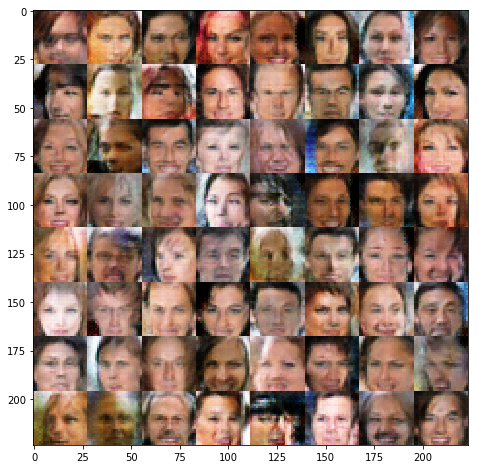

Epoch 1/1... Batch 2805 Discriminator Loss: 1.1380... Generator Loss: 1.0117
Epoch 1/1... Batch 2810 Discriminator Loss: 1.0525... Generator Loss: 0.9287
Epoch 1/1... Batch 2815 Discriminator Loss: 1.2822... Generator Loss: 0.8215
Epoch 1/1... Batch 2820 Discriminator Loss: 1.1902... Generator Loss: 0.8375
Epoch 1/1... Batch 2825 Discriminator Loss: 0.8615... Generator Loss: 0.9860
Epoch 1/1... Batch 2830 Discriminator Loss: 1.3542... Generator Loss: 0.5890
Epoch 1/1... Batch 2835 Discriminator Loss: 1.1808... Generator Loss: 1.3861
Epoch 1/1... Batch 2840 Discriminator Loss: 1.3320... Generator Loss: 0.6059
Epoch 1/1... Batch 2845 Discriminator Loss: 1.1463... Generator Loss: 0.9189
Epoch 1/1... Batch 2850 Discriminator Loss: 1.0843... Generator Loss: 0.9033


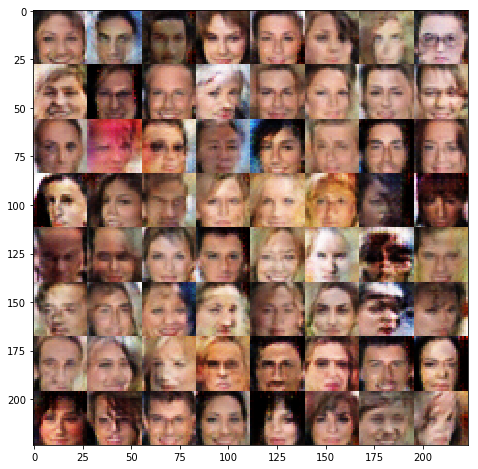

Epoch 1/1... Batch 2855 Discriminator Loss: 1.2359... Generator Loss: 0.7717
Epoch 1/1... Batch 2860 Discriminator Loss: 1.4104... Generator Loss: 0.6602
Epoch 1/1... Batch 2865 Discriminator Loss: 1.1784... Generator Loss: 0.7157
Epoch 1/1... Batch 2870 Discriminator Loss: 1.2543... Generator Loss: 0.6834
Epoch 1/1... Batch 2875 Discriminator Loss: 1.2731... Generator Loss: 0.8872
Epoch 1/1... Batch 2880 Discriminator Loss: 1.0766... Generator Loss: 0.9556
Epoch 1/1... Batch 2885 Discriminator Loss: 1.4408... Generator Loss: 0.6577
Epoch 1/1... Batch 2890 Discriminator Loss: 1.3415... Generator Loss: 1.0797
Epoch 1/1... Batch 2895 Discriminator Loss: 1.1894... Generator Loss: 0.9136
Epoch 1/1... Batch 2900 Discriminator Loss: 1.2083... Generator Loss: 1.1240


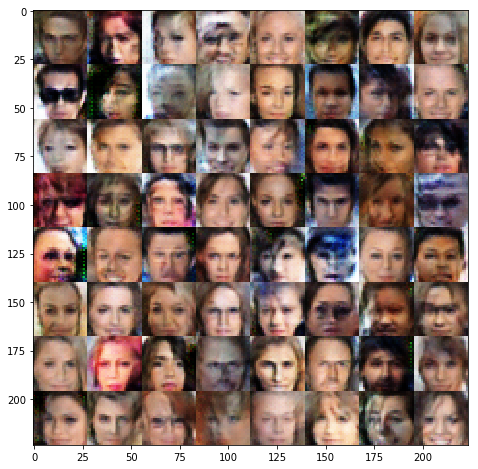

Epoch 1/1... Batch 2905 Discriminator Loss: 1.0895... Generator Loss: 0.7921
Epoch 1/1... Batch 2910 Discriminator Loss: 1.2690... Generator Loss: 0.8359
Epoch 1/1... Batch 2915 Discriminator Loss: 1.2936... Generator Loss: 0.8745
Epoch 1/1... Batch 2920 Discriminator Loss: 1.2551... Generator Loss: 1.1645
Epoch 1/1... Batch 2925 Discriminator Loss: 1.3030... Generator Loss: 1.1170
Epoch 1/1... Batch 2930 Discriminator Loss: 1.0637... Generator Loss: 0.8810
Epoch 1/1... Batch 2935 Discriminator Loss: 1.3825... Generator Loss: 0.7872
Epoch 1/1... Batch 2940 Discriminator Loss: 1.4666... Generator Loss: 1.3018
Epoch 1/1... Batch 2945 Discriminator Loss: 0.7988... Generator Loss: 1.1773
Epoch 1/1... Batch 2950 Discriminator Loss: 1.0871... Generator Loss: 0.9903


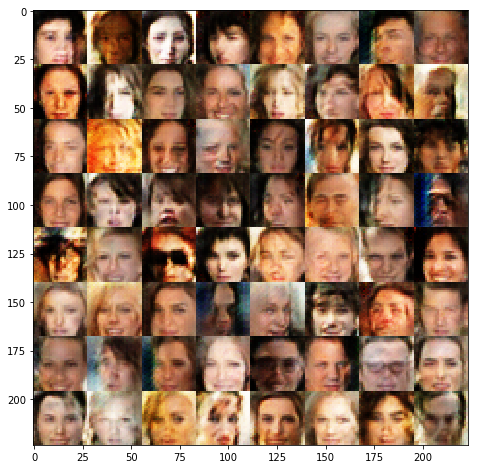

Epoch 1/1... Batch 2955 Discriminator Loss: 1.3204... Generator Loss: 0.7537
Epoch 1/1... Batch 2960 Discriminator Loss: 1.2189... Generator Loss: 0.8590
Epoch 1/1... Batch 2965 Discriminator Loss: 1.2699... Generator Loss: 0.7370
Epoch 1/1... Batch 2970 Discriminator Loss: 1.1849... Generator Loss: 0.7569
Epoch 1/1... Batch 2975 Discriminator Loss: 1.1009... Generator Loss: 0.8856
Epoch 1/1... Batch 2980 Discriminator Loss: 1.3001... Generator Loss: 0.8620
Epoch 1/1... Batch 2985 Discriminator Loss: 1.1896... Generator Loss: 0.7553
Epoch 1/1... Batch 2990 Discriminator Loss: 1.1482... Generator Loss: 1.1502
Epoch 1/1... Batch 2995 Discriminator Loss: 1.5873... Generator Loss: 0.4733
Epoch 1/1... Batch 3000 Discriminator Loss: 1.1918... Generator Loss: 0.9196


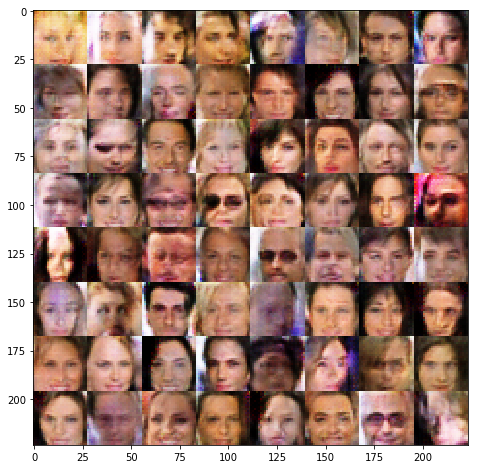

Epoch 1/1... Batch 3005 Discriminator Loss: 1.1070... Generator Loss: 0.8771
Epoch 1/1... Batch 3010 Discriminator Loss: 1.1364... Generator Loss: 0.8118
Epoch 1/1... Batch 3015 Discriminator Loss: 1.4174... Generator Loss: 0.7797
Epoch 1/1... Batch 3020 Discriminator Loss: 1.3518... Generator Loss: 1.1186
Epoch 1/1... Batch 3025 Discriminator Loss: 1.0992... Generator Loss: 0.7730
Epoch 1/1... Batch 3030 Discriminator Loss: 1.6363... Generator Loss: 0.4551
Epoch 1/1... Batch 3035 Discriminator Loss: 1.1619... Generator Loss: 0.8258
Epoch 1/1... Batch 3040 Discriminator Loss: 1.2199... Generator Loss: 0.8546
Epoch 1/1... Batch 3045 Discriminator Loss: 1.2606... Generator Loss: 0.9669
Epoch 1/1... Batch 3050 Discriminator Loss: 1.3346... Generator Loss: 0.8306


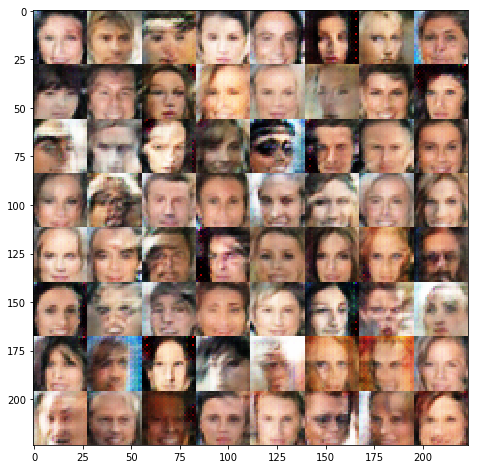

Epoch 1/1... Batch 3055 Discriminator Loss: 1.2813... Generator Loss: 0.8153
Epoch 1/1... Batch 3060 Discriminator Loss: 1.2185... Generator Loss: 0.7815
Epoch 1/1... Batch 3065 Discriminator Loss: 1.3488... Generator Loss: 0.9263
Epoch 1/1... Batch 3070 Discriminator Loss: 1.0078... Generator Loss: 0.7970
Epoch 1/1... Batch 3075 Discriminator Loss: 1.2953... Generator Loss: 0.9178
Epoch 1/1... Batch 3080 Discriminator Loss: 1.2086... Generator Loss: 0.7999
Epoch 1/1... Batch 3085 Discriminator Loss: 1.2507... Generator Loss: 0.8830
Epoch 1/1... Batch 3090 Discriminator Loss: 1.0926... Generator Loss: 0.7729
Epoch 1/1... Batch 3095 Discriminator Loss: 1.4105... Generator Loss: 0.7937
Epoch 1/1... Batch 3100 Discriminator Loss: 1.1342... Generator Loss: 1.1091


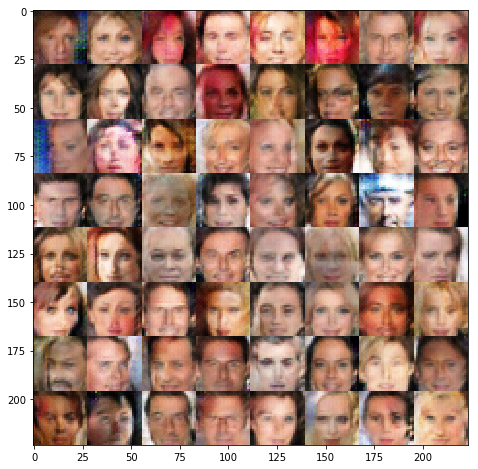

Epoch 1/1... Batch 3105 Discriminator Loss: 1.3072... Generator Loss: 0.7052
Epoch 1/1... Batch 3110 Discriminator Loss: 1.3151... Generator Loss: 0.7119
Epoch 1/1... Batch 3115 Discriminator Loss: 1.3147... Generator Loss: 0.9370
Epoch 1/1... Batch 3120 Discriminator Loss: 1.2602... Generator Loss: 0.8078
Epoch 1/1... Batch 3125 Discriminator Loss: 1.1954... Generator Loss: 0.8524
Epoch 1/1... Batch 3130 Discriminator Loss: 1.3335... Generator Loss: 0.7407
Epoch 1/1... Batch 3135 Discriminator Loss: 1.1098... Generator Loss: 0.8383
Epoch 1/1... Batch 3140 Discriminator Loss: 1.1131... Generator Loss: 0.8575
Epoch 1/1... Batch 3145 Discriminator Loss: 1.1415... Generator Loss: 0.8597
Epoch 1/1... Batch 3150 Discriminator Loss: 1.2631... Generator Loss: 0.7107


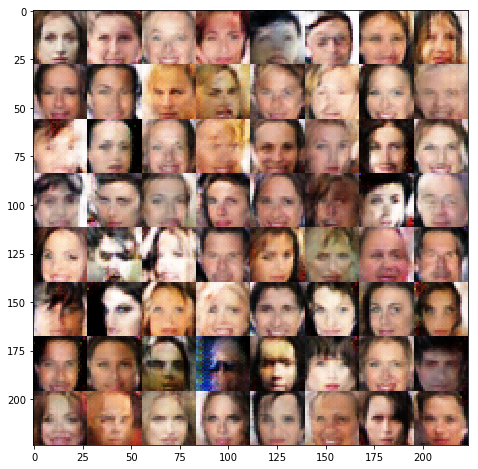

Epoch 1/1... Batch 3155 Discriminator Loss: 1.4037... Generator Loss: 0.5914
Epoch 1/1... Batch 3160 Discriminator Loss: 1.1712... Generator Loss: 0.9454
Epoch 1/1... Batch 3165 Discriminator Loss: 0.9281... Generator Loss: 0.9788


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5
alpha_ = 0.1

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.